In [1]:
import pandas as pd
import numpy as np

In [2]:
df_artist_collab = pd.read_csv("Music dataset/Artist Collaboration Network/global/entire-table-preprocessing.csv",converters={"song_ids": lambda x: x.strip("[]").replace("'","").split(", ")})
df_artist_collab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3061 entries, 0 to 3060
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   artist_1  3061 non-null   object
 1   artist_2  3061 non-null   object
 2   count     3061 non-null   int64 
 3   song_ids  3061 non-null   object
dtypes: int64(1), object(3)
memory usage: 95.8+ KB


In [3]:
df_artist_collab = df_artist_collab.explode('song_ids',ignore_index=True)
df_artist_collab


,artist_1,artist_2,count,song_ids
0,Dalex,Lenny Tavárez,11,1Xnn1TPyr5h0hpRAT4B4EA
1,Dalex,Lenny Tavárez,11,5Id5B3dxJZhPcV9GzgYZZe
2,Dalex,Lenny Tavárez,11,7anSoGdgtmJTAPZBzcPhO6
3,Dalex,Lenny Tavárez,11,224EVTFiLsdQignUFLvDeH
4,Dalex,Lenny Tavárez,11,1tpbAGsGpZee5jDHMcLrUJ
...,...,...,...,...
4185,Manuel Turizo,Zion & Lennox,1,2ktoFujjJtantyMoVdBJlX
4186,Kelsea Ballerini,The Chainsmokers,1,4NBTZtAt1F13VvlSKe6KTl
4187,Apache 207,Sido,1,2u8AXJyk8pICzj2wyPBL0b
4188,21 Savage,Metro Boomin,1,0AluA5RNsa4Cx6XRhf2hWZ


In [4]:
# %%
df_artist_collab.drop('count', axis=1,inplace=True)
df_artist_collab.rename(columns={"song_ids":"song_id"},inplace=True)
df_artist_collab



,artist_1,artist_2,song_id
0,Dalex,Lenny Tavárez,1Xnn1TPyr5h0hpRAT4B4EA
1,Dalex,Lenny Tavárez,5Id5B3dxJZhPcV9GzgYZZe
2,Dalex,Lenny Tavárez,7anSoGdgtmJTAPZBzcPhO6
3,Dalex,Lenny Tavárez,224EVTFiLsdQignUFLvDeH
4,Dalex,Lenny Tavárez,1tpbAGsGpZee5jDHMcLrUJ
...,...,...,...
4185,Manuel Turizo,Zion & Lennox,2ktoFujjJtantyMoVdBJlX
4186,Kelsea Ballerini,The Chainsmokers,4NBTZtAt1F13VvlSKe6KTl
4187,Apache 207,Sido,2u8AXJyk8pICzj2wyPBL0b
4188,21 Savage,Metro Boomin,0AluA5RNsa4Cx6XRhf2hWZ


In [5]:
# %%
df_song = pd.read_csv("Music dataset/Hit Songs/spotify_hits_dataset_complete.csv",converters={"artist_name": lambda x: x.strip("[]").replace("'","").split(", ")},sep="\t")
df_song = df_song[df_song["song_type"] != "Solo"]
df_song = df_song.reset_index(drop=True)

#df_song.drop("index",inplace=True)
df_song.head()

,song_id,song_name,artist_id,artist_name,popularity,explicit,song_type,track_number,num_artists,num_available_markets,...,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",58,True,Collaboration,1,2,79,...,3,0.0209,0.614,0.6410,0.000000,0.0659,-6.751,0.2880,0.4920,123.539
1,6FxCPvx8Ovm9y77DO6vuy5,"Main Title ""Somewhere in My Memory"" (From ""Hom...","['3dRfiJ2650SZu6GbydcHNb', '7CIcEIOiWaZcEH35cp...","[John Williams, Boston Pops Orchestra]",27,False,Collaboration,9,2,78,...,4,0.9690,0.150,0.0577,0.363000,0.0873,-21.255,0.0362,0.0701,71.564
2,2Wr970IfovsSGnfkE08iMF,Find Me,"['01pKrlgPJhm5dB4lneYAqS', '2WX2uTcsvV5OnS0inA...","[Sigma, Birdy]",4,False,Collaboration,1,2,0,...,4,0.0640,0.572,0.7970,0.000000,0.1050,-3.995,0.0483,0.2520,135.006
3,2kPpxNSgXRvu5yqkRLKJIu,Winter Wonderland / Don't Worry Be Happy (feat...,"['26AHtbjWKiwYzsoGoUZq53', '1vSN1fsvrzpbttOYGs...","[Pentatonix, Tori Kelly]",45,False,Collaboration,4,2,78,...,4,0.2800,0.610,0.3970,0.000000,0.0833,-8.506,0.0504,0.7180,129.761
4,5sCwso3aURYAdieWEFI1nE,Icy (feat. Gucci Mane),"['4xRYI6VqpkE3UwrDrAZL8L', '13y7CgLHjMVRMDqxdx...","[Logic, Gucci Mane]",3,True,Collaboration,9,2,0,...,4,0.1630,0.827,0.5220,0.000001,0.1090,-4.866,0.0845,0.4770,151.990


In [6]:
df_song.shape

(4987, 24)

# Artist table load

In [7]:
df_artists=pd.read_csv("Music dataset/Artists/spotify_artists_info_complete.csv", sep="\t")
df_artists.drop("image_url",axis=1,inplace=True)
df_artists.rename(columns={"name":"artist_name"},inplace=True)
df_artists.head()

,artist_id,artist_name,followers,popularity,genres
0,1WgXqy2Dd70QQOU7Ay074N,AURORA,923204,75,['norwegian pop']
1,2dXKh2aHr7RS2RVPlWJoUS,MHD,2707,24,[]
2,293zczrfYafIItmnmM3coR,Chuck Berry,1103439,67,"['blues rock', 'classic rock', 'folk rock', 'r..."
3,4DqRDyrUuJO8CuxfgVCU3m,Hasan.K,38,29,[]
4,1U5zgr455OGyIkLNXvDdrf,Traditional,26672,64,['sleep']


In [8]:
df_artists.shape

(3612, 5)

# Combining as 2 artist per song

In [9]:
import pandas as pd
from itertools import combinations

# Assuming merged_df is the DataFrame with columns artist_1, artist_2, and artist_name

# Create an empty list to store the new DataFrames
new_dfs = []

# Define a function to process each row
def fill_artists(row):
    artists_list = row['artist_name']
    if artists_list:
        if len(artists_list) == 2:
            # If there are 2 artists, fill artist_1 and artist_2 accordingly
            row['artist_1'] = artists_list[0]
            row['artist_2'] = artists_list[1]
            new_dfs.append(row.to_frame().transpose())
        elif len(artists_list) > 2:
            # If there are more than 2 artists, create new rows for each combination
            top_artists = sorted(artists_list, key=lambda x: df_artists[df_artists['artist_name'].isin(artists_list)]['followers'].max(), reverse=True)[:2]
            row['artist_1'] = top_artists[0]
            row['artist_2'] = top_artists[1]
            new_dfs.append(row.to_frame().transpose())
    else:
        new_dfs.append(row.to_frame().transpose())

# Apply the function to each row of the DataFrame
df_song.apply(fill_artists, axis=1)

# Concatenate the new DataFrames into a single DataFrame
new_rows_df = pd.concat(new_dfs, ignore_index=True)

# Print the updated DataFrame
print(new_rows_df)

                     song_id  \
0     0MET90crciVlxlE07ub7Rn   
1     6FxCPvx8Ovm9y77DO6vuy5   
2     2Wr970IfovsSGnfkE08iMF   
3     2kPpxNSgXRvu5yqkRLKJIu   
4     5sCwso3aURYAdieWEFI1nE   
...                      ...   
4982  26bMmC90QF0FOd1ctDnkeU   
4983  1oBsrVp5CpLVpxX0WdHQvt   
4984  4W598w0KcHVG5Nwqk0qMpj   
4985  3at8iNHLzE5EizkFWoQzCK   
4986  2Gl0FzuLxflY6nPifJp5Dr   

                                              song_name  \
0                          Good Love (feat. Tory Lanez)   
1     Main Title "Somewhere in My Memory" (From "Hom...   
2                                               Find Me   
3     Winter Wonderland / Don't Worry Be Happy (feat...   
4                                Icy (feat. Gucci Mane)   
...                                                 ...   
4982                                  Mulherão da Porra   
4983                                             Dealer   
4984                                              Three   
4985                     

In [10]:
new_rows_df

,song_id,song_name,artist_id,artist_name,popularity,explicit,song_type,track_number,num_artists,num_available_markets,...,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",58,True,Collaboration,1,2,79,...,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez
1,6FxCPvx8Ovm9y77DO6vuy5,"Main Title ""Somewhere in My Memory"" (From ""Hom...","['3dRfiJ2650SZu6GbydcHNb', '7CIcEIOiWaZcEH35cp...","[John Williams, Boston Pops Orchestra]",27,False,Collaboration,9,2,78,...,0.15,0.0577,0.363,0.0873,-21.255,0.0362,0.0701,71.564,John Williams,Boston Pops Orchestra
2,2Wr970IfovsSGnfkE08iMF,Find Me,"['01pKrlgPJhm5dB4lneYAqS', '2WX2uTcsvV5OnS0inA...","[Sigma, Birdy]",4,False,Collaboration,1,2,0,...,0.572,0.797,0.0,0.105,-3.995,0.0483,0.252,135.006,Sigma,Birdy
3,2kPpxNSgXRvu5yqkRLKJIu,Winter Wonderland / Don't Worry Be Happy (feat...,"['26AHtbjWKiwYzsoGoUZq53', '1vSN1fsvrzpbttOYGs...","[Pentatonix, Tori Kelly]",45,False,Collaboration,4,2,78,...,0.61,0.397,0.0,0.0833,-8.506,0.0504,0.718,129.761,Pentatonix,Tori Kelly
4,5sCwso3aURYAdieWEFI1nE,Icy (feat. Gucci Mane),"['4xRYI6VqpkE3UwrDrAZL8L', '13y7CgLHjMVRMDqxdx...","[Logic, Gucci Mane]",3,True,Collaboration,9,2,0,...,0.827,0.522,0.000001,0.109,-4.866,0.0845,0.477,151.99,Logic,Gucci Mane
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4982,26bMmC90QF0FOd1ctDnkeU,Mulherão da Porra,"['0OWtaM1z81DliQXntU4KaN', '6OpOg5HVCc8xVf7OVr...","[Munhoz & Mariano, Jerry Smith]",48,True,Collaboration,1,2,79,...,0.811,0.696,0.0,0.196,-5.209,0.0553,0.44,128.031,Munhoz & Mariano,Jerry Smith
4983,1oBsrVp5CpLVpxX0WdHQvt,Dealer,"['10XY9PZCJKzUFzZOdtlQLU', '0b62itBWBdLgiecXjX...","[LX, Maxwell]",0,True,Collaboration,1,2,0,...,0.614,0.763,0.0,0.19,-5.75,0.394,0.376,128.069,LX,Maxwell
4984,4W598w0KcHVG5Nwqk0qMpj,Three,"['1RyvyyTE3xzB2ZywiAwp0i', '50co4Is1HCEo8bhOyU...","[Future, Young Thug]",51,True,Collaboration,2,2,69,...,0.725,0.692,0.0,0.0912,-5.742,0.257,0.298,169.025,Future,Young Thug
4985,3at8iNHLzE5EizkFWoQzCK,Nana,"['62zLrboqOTPyozwi721CVy', '74tb4BL2gQ28BJicVA...","[Lorenzo, LES ANTICIPATEURS]",52,True,Collaboration,7,2,79,...,0.755,0.737,0.0,0.116,-5.77,0.0505,0.753,145.961,Lorenzo,LES ANTICIPATEURS


In [11]:
new_rows_df.isna().sum()

song_id                   0
song_name                18
artist_id                 0
artist_name               0
popularity                0
explicit                  0
song_type                 0
track_number              0
num_artists               0
num_available_markets     0
release_date              0
duration_ms               0
key                       0
mode                      0
time_signature            0
acousticness              0
danceability              0
energy                    0
instrumentalness          0
liveness                  0
loudness                  0
speechiness               0
valence                   0
tempo                     0
artist_1                  0
artist_2                  0
dtype: int64

In [12]:
new_rows_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4987 entries, 0 to 4986
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   song_id                4987 non-null   object
 1   song_name              4969 non-null   object
 2   artist_id              4987 non-null   object
 3   artist_name            4987 non-null   object
 4   popularity             4987 non-null   object
 5   explicit               4987 non-null   object
 6   song_type              4987 non-null   object
 7   track_number           4987 non-null   object
 8   num_artists            4987 non-null   object
 9   num_available_markets  4987 non-null   object
 10  release_date           4987 non-null   object
 11  duration_ms            4987 non-null   object
 12  key                    4987 non-null   object
 13  mode                   4987 non-null   object
 14  time_signature         4987 non-null   object
 15  acousticness         

In [13]:
new_rows_df[new_rows_df['song_name'].isna()]

,song_id,song_name,artist_id,artist_name,popularity,explicit,song_type,track_number,num_artists,num_available_markets,...,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2
235,5TTzhRSWQS4Yu8xTgAuq6D,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",1,True,Collaboration,13,2,0,...,0.465,0.82,0.0,0.0888,-5.907,0.307,0.505,86.839,,
486,5rbXOUQCaYcSnW5EOgfVaD,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",0,True,Collaboration,19,2,0,...,0.789,0.794,0.0,0.108,-5.876,0.1,0.334,108.852,,
596,4nbg6j4t38jiFdwXt3kiLQ,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",0,True,Collaboration,15,2,0,...,0.419,0.688,0.0,0.104,-7.332,0.361,0.149,79.145,,
603,20yDAohnjeOlLpnogPhnCO,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",1,True,Collaboration,12,2,0,...,0.485,0.693,0.0,0.49,-6.478,0.288,0.567,89.568,,
1054,5WkVuwmvmbmysXlKtdfkRD,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",1,True,Collaboration,11,2,0,...,0.608,0.631,0.000001,0.287,-7.096,0.414,0.146,119.201,,
1216,7CbkW1lLxOM5D6YWTnzknv,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",1,True,Collaboration,9,2,0,...,0.547,0.881,0.0,0.386,-5.994,0.31,0.44,86.628,,
1227,1xSTaiXN33Y5chE2bFixVo,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",0,True,Collaboration,1,2,0,...,0.426,0.722,0.0,0.117,-5.112,0.388,0.393,93.014,,
1716,2ohk9OZFaYwo8UrRm3ewqq,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",0,True,Collaboration,14,2,0,...,0.526,0.717,0.0,0.117,-6.744,0.439,0.354,147.437,,
2734,667XbVuYeoYAVUBzB9Z7Q8,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",1,True,Collaboration,17,2,0,...,0.492,0.688,0.0,0.0566,-6.913,0.316,0.29,175.801,,
3191,34IY2117PizF4NoRPoMth6,NaN,"['6gto7HVNhu4ARE3P3g8Y5Y', '2JwyRtuXf2l6sTnSnG...","[, ]",0,True,Collaboration,3,2,0,...,0.727,0.757,0.0,0.115,-5.785,0.14,0.647,150.002,,


In [14]:
# Assuming new_rows_df is the DataFrame you want to modify

# Drop rows where song_name is NaN
new_rows_df.dropna(subset=['song_name'], inplace=True)

# Reset the index after dropping rows
new_rows_df.reset_index(drop=True, inplace=True)

# Print the updated DataFrame
print(new_rows_df)

                     song_id  \
0     0MET90crciVlxlE07ub7Rn   
1     6FxCPvx8Ovm9y77DO6vuy5   
2     2Wr970IfovsSGnfkE08iMF   
3     2kPpxNSgXRvu5yqkRLKJIu   
4     5sCwso3aURYAdieWEFI1nE   
...                      ...   
4964  26bMmC90QF0FOd1ctDnkeU   
4965  1oBsrVp5CpLVpxX0WdHQvt   
4966  4W598w0KcHVG5Nwqk0qMpj   
4967  3at8iNHLzE5EizkFWoQzCK   
4968  2Gl0FzuLxflY6nPifJp5Dr   

                                              song_name  \
0                          Good Love (feat. Tory Lanez)   
1     Main Title "Somewhere in My Memory" (From "Hom...   
2                                               Find Me   
3     Winter Wonderland / Don't Worry Be Happy (feat...   
4                                Icy (feat. Gucci Mane)   
...                                                 ...   
4964                                  Mulherão da Porra   
4965                                             Dealer   
4966                                              Three   
4967                     

In [15]:
new_rows_df

,song_id,song_name,artist_id,artist_name,popularity,explicit,song_type,track_number,num_artists,num_available_markets,...,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",58,True,Collaboration,1,2,79,...,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez
1,6FxCPvx8Ovm9y77DO6vuy5,"Main Title ""Somewhere in My Memory"" (From ""Hom...","['3dRfiJ2650SZu6GbydcHNb', '7CIcEIOiWaZcEH35cp...","[John Williams, Boston Pops Orchestra]",27,False,Collaboration,9,2,78,...,0.15,0.0577,0.363,0.0873,-21.255,0.0362,0.0701,71.564,John Williams,Boston Pops Orchestra
2,2Wr970IfovsSGnfkE08iMF,Find Me,"['01pKrlgPJhm5dB4lneYAqS', '2WX2uTcsvV5OnS0inA...","[Sigma, Birdy]",4,False,Collaboration,1,2,0,...,0.572,0.797,0.0,0.105,-3.995,0.0483,0.252,135.006,Sigma,Birdy
3,2kPpxNSgXRvu5yqkRLKJIu,Winter Wonderland / Don't Worry Be Happy (feat...,"['26AHtbjWKiwYzsoGoUZq53', '1vSN1fsvrzpbttOYGs...","[Pentatonix, Tori Kelly]",45,False,Collaboration,4,2,78,...,0.61,0.397,0.0,0.0833,-8.506,0.0504,0.718,129.761,Pentatonix,Tori Kelly
4,5sCwso3aURYAdieWEFI1nE,Icy (feat. Gucci Mane),"['4xRYI6VqpkE3UwrDrAZL8L', '13y7CgLHjMVRMDqxdx...","[Logic, Gucci Mane]",3,True,Collaboration,9,2,0,...,0.827,0.522,0.000001,0.109,-4.866,0.0845,0.477,151.99,Logic,Gucci Mane
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4964,26bMmC90QF0FOd1ctDnkeU,Mulherão da Porra,"['0OWtaM1z81DliQXntU4KaN', '6OpOg5HVCc8xVf7OVr...","[Munhoz & Mariano, Jerry Smith]",48,True,Collaboration,1,2,79,...,0.811,0.696,0.0,0.196,-5.209,0.0553,0.44,128.031,Munhoz & Mariano,Jerry Smith
4965,1oBsrVp5CpLVpxX0WdHQvt,Dealer,"['10XY9PZCJKzUFzZOdtlQLU', '0b62itBWBdLgiecXjX...","[LX, Maxwell]",0,True,Collaboration,1,2,0,...,0.614,0.763,0.0,0.19,-5.75,0.394,0.376,128.069,LX,Maxwell
4966,4W598w0KcHVG5Nwqk0qMpj,Three,"['1RyvyyTE3xzB2ZywiAwp0i', '50co4Is1HCEo8bhOyU...","[Future, Young Thug]",51,True,Collaboration,2,2,69,...,0.725,0.692,0.0,0.0912,-5.742,0.257,0.298,169.025,Future,Young Thug
4967,3at8iNHLzE5EizkFWoQzCK,Nana,"['62zLrboqOTPyozwi721CVy', '74tb4BL2gQ28BJicVA...","[Lorenzo, LES ANTICIPATEURS]",52,True,Collaboration,7,2,79,...,0.755,0.737,0.0,0.116,-5.77,0.0505,0.753,145.961,Lorenzo,LES ANTICIPATEURS


In [16]:
# merge artist_collab_songs dataframe with the artist 1 details
merged_df_with_artist1 = pd.merge(new_rows_df,df_artists,left_on='artist_1', right_on='artist_name')
merged_df_with_artist1.head()

,song_id,song_name,artist_id_x,artist_name_x,popularity_x,explicit,song_type,track_number,num_artists,num_available_markets,...,speechiness,valence,tempo,artist_1,artist_2,artist_id_y,artist_name_y,followers,popularity_y,genres
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",58,True,Collaboration,1,2,79,...,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']"
1,2sMkhUglKashsCjp76uOB9,Like a Film (feat. M Huncho),"['3dKjmeRZcSUw617CoMzEA0', '491U1PrV1EoQuhM0aU...","[Nafe Smallz, M Huncho]",51,True,Collaboration,1,2,79,...,0.227,0.416,130.068,Nafe Smallz,M Huncho,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']"
2,5u6o597GcbXH20H3LeVkHP,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",47,True,Collaboration,1,2,79,...,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']"
3,2BCB7BfbOxdRrIrzf8qLh4,Fake Love (feat. Yxng Bane),"['3dKjmeRZcSUw617CoMzEA0', '5AbLpsnTQVNB3OEadY...","[Nafe Smallz, Yxng Bane]",59,True,Collaboration,7,2,79,...,0.491,0.307,84.23,Nafe Smallz,Yxng Bane,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']"
4,6FxCPvx8Ovm9y77DO6vuy5,"Main Title ""Somewhere in My Memory"" (From ""Hom...","['3dRfiJ2650SZu6GbydcHNb', '7CIcEIOiWaZcEH35cp...","[John Williams, Boston Pops Orchestra]",27,False,Collaboration,9,2,78,...,0.0362,0.0701,71.564,John Williams,Boston Pops Orchestra,3dRfiJ2650SZu6GbydcHNb,John Williams,856056,76,['soundtrack']


In [17]:
merged_df_with_artist1.rename(columns={"artist_id_y":"artist_id_1", "artist_name_y":"artist_name_1","followers":"followers_artist1","popularity":"popularity_artist1","genres":"genres_artist1"},inplace=True)
merged_df_with_artist1.head()

,song_id,song_name,artist_id_x,artist_name_x,popularity_x,explicit,song_type,track_number,num_artists,num_available_markets,...,speechiness,valence,tempo,artist_1,artist_2,artist_id_1,artist_name_1,followers_artist1,popularity_y,genres_artist1
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",58,True,Collaboration,1,2,79,...,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']"
1,2sMkhUglKashsCjp76uOB9,Like a Film (feat. M Huncho),"['3dKjmeRZcSUw617CoMzEA0', '491U1PrV1EoQuhM0aU...","[Nafe Smallz, M Huncho]",51,True,Collaboration,1,2,79,...,0.227,0.416,130.068,Nafe Smallz,M Huncho,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']"
2,5u6o597GcbXH20H3LeVkHP,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",47,True,Collaboration,1,2,79,...,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']"
3,2BCB7BfbOxdRrIrzf8qLh4,Fake Love (feat. Yxng Bane),"['3dKjmeRZcSUw617CoMzEA0', '5AbLpsnTQVNB3OEadY...","[Nafe Smallz, Yxng Bane]",59,True,Collaboration,7,2,79,...,0.491,0.307,84.23,Nafe Smallz,Yxng Bane,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']"
4,6FxCPvx8Ovm9y77DO6vuy5,"Main Title ""Somewhere in My Memory"" (From ""Hom...","['3dRfiJ2650SZu6GbydcHNb', '7CIcEIOiWaZcEH35cp...","[John Williams, Boston Pops Orchestra]",27,False,Collaboration,9,2,78,...,0.0362,0.0701,71.564,John Williams,Boston Pops Orchestra,3dRfiJ2650SZu6GbydcHNb,John Williams,856056,76,['soundtrack']


In [18]:
# merging artist details for artist 2
merged_df_with_artist2 = pd.merge(merged_df_with_artist1,df_artists,left_on='artist_2', right_on='artist_name')
merged_df_with_artist2.head()

,song_id,song_name,artist_id_x,artist_name_x,popularity_x,explicit,song_type,track_number,num_artists,num_available_markets,...,artist_id_1,artist_name_1,followers_artist1,popularity_y,genres_artist1,artist_id,artist_name,followers,popularity,genres
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",58,True,Collaboration,1,2,79,...,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
1,5u6o597GcbXH20H3LeVkHP,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",47,True,Collaboration,1,2,79,...,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
2,56S5YTNqlsXSnR5T1S2oyJ,Sickening,"['6Xgp2XMz1fhVYe7i6yNAax', '2jku7tDXc6XoB6MO2h...","[Trippie Redd, Tory Lanez]",61,True,Collaboration,12,2,79,...,6Xgp2XMz1fhVYe7i6yNAax,Trippie Redd,4543729,89,"['melodic rap', 'rap', 'trap']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
3,6bKUUSlzDua0gt0g13OKqw,Diamond Minds,"['6Xgp2XMz1fhVYe7i6yNAax', '2jku7tDXc6XoB6MO2h...","[Trippie Redd, Tory Lanez, Elliott Trent]",58,True,Collaboration,15,3,79,...,6Xgp2XMz1fhVYe7i6yNAax,Trippie Redd,4543729,89,"['melodic rap', 'rap', 'trap']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
4,3J3JcR6Akadd7R42qoqdhy,Es Rollt,"['0b62itBWBdLgiecXjXCqKC', '2jku7tDXc6XoB6MO2h...","[Maxwell, Tory Lanez, Gzuz]",41,True,Collaboration,6,3,76,...,0b62itBWBdLgiecXjXCqKC,Maxwell,146136,72,"['deep german hip hop', 'german hip hop']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."


In [19]:
merged_df_with_artist2.rename(columns={"artist_id":"artist_id_2","artist_name":"artist_name_2","followers":"followers_artist2","popularity":"popularity_artist2","genres":"genres_artist2"},inplace=True)
merged_df_with_artist2.head()

,song_id,song_name,artist_id_x,artist_name_x,popularity_x,explicit,song_type,track_number,num_artists,num_available_markets,...,artist_id_1,artist_name_1,followers_artist1,popularity_y,genres_artist1,artist_id_2,artist_name_2,followers_artist2,popularity_artist2,genres_artist2
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",58,True,Collaboration,1,2,79,...,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
1,5u6o597GcbXH20H3LeVkHP,Good Love (feat. Tory Lanez),"['3dKjmeRZcSUw617CoMzEA0', '2jku7tDXc6XoB6MO2h...","[Nafe Smallz, Tory Lanez]",47,True,Collaboration,1,2,79,...,3dKjmeRZcSUw617CoMzEA0,Nafe Smallz,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
2,56S5YTNqlsXSnR5T1S2oyJ,Sickening,"['6Xgp2XMz1fhVYe7i6yNAax', '2jku7tDXc6XoB6MO2h...","[Trippie Redd, Tory Lanez]",61,True,Collaboration,12,2,79,...,6Xgp2XMz1fhVYe7i6yNAax,Trippie Redd,4543729,89,"['melodic rap', 'rap', 'trap']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
3,6bKUUSlzDua0gt0g13OKqw,Diamond Minds,"['6Xgp2XMz1fhVYe7i6yNAax', '2jku7tDXc6XoB6MO2h...","[Trippie Redd, Tory Lanez, Elliott Trent]",58,True,Collaboration,15,3,79,...,6Xgp2XMz1fhVYe7i6yNAax,Trippie Redd,4543729,89,"['melodic rap', 'rap', 'trap']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
4,3J3JcR6Akadd7R42qoqdhy,Es Rollt,"['0b62itBWBdLgiecXjXCqKC', '2jku7tDXc6XoB6MO2h...","[Maxwell, Tory Lanez, Gzuz]",41,True,Collaboration,6,3,76,...,0b62itBWBdLgiecXjXCqKC,Maxwell,146136,72,"['deep german hip hop', 'german hip hop']",2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."


In [20]:
merged_df_with_artist2.isna().sum()

song_id                  0
song_name                0
artist_id_x              0
artist_name_x            0
popularity_x             0
explicit                 0
song_type                0
track_number             0
num_artists              0
num_available_markets    0
release_date             0
duration_ms              0
key                      0
mode                     0
time_signature           0
acousticness             0
danceability             0
energy                   0
instrumentalness         0
liveness                 0
loudness                 0
speechiness              0
valence                  0
tempo                    0
artist_1                 0
artist_2                 0
artist_id_1              0
artist_name_1            0
followers_artist1        0
popularity_y             0
genres_artist1           0
artist_id_2              0
artist_name_2            0
followers_artist2        0
popularity_artist2       0
genres_artist2           0
dtype: int64

In [21]:
merged_df_with_artist2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5181 entries, 0 to 5180
Data columns (total 36 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   song_id                5181 non-null   object
 1   song_name              5181 non-null   object
 2   artist_id_x            5181 non-null   object
 3   artist_name_x          5181 non-null   object
 4   popularity_x           5181 non-null   object
 5   explicit               5181 non-null   object
 6   song_type              5181 non-null   object
 7   track_number           5181 non-null   object
 8   num_artists            5181 non-null   object
 9   num_available_markets  5181 non-null   object
 10  release_date           5181 non-null   object
 11  duration_ms            5181 non-null   object
 12  key                    5181 non-null   object
 13  mode                   5181 non-null   object
 14  time_signature         5181 non-null   object
 15  acousticness         

In [22]:
merged_df_with_artist2.drop(["artist_id_x","song_type","artist_id_1","artist_name_1","artist_id_2","artist_name_2"],axis=1,inplace=True)
merged_df_with_artist2.head()

,song_id,song_name,artist_name_x,popularity_x,explicit,track_number,num_artists,num_available_markets,release_date,duration_ms,...,valence,tempo,artist_1,artist_2,followers_artist1,popularity_y,genres_artist1,followers_artist2,popularity_artist2,genres_artist2
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"[Nafe Smallz, Tory Lanez]",58,True,1,2,79,2019-06-21,192000,...,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
1,5u6o597GcbXH20H3LeVkHP,Good Love (feat. Tory Lanez),"[Nafe Smallz, Tory Lanez]",47,True,1,2,79,2019-06-13,192000,...,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
2,56S5YTNqlsXSnR5T1S2oyJ,Sickening,"[Trippie Redd, Tory Lanez]",61,True,12,2,79,2019-11-22,193933,...,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
3,6bKUUSlzDua0gt0g13OKqw,Diamond Minds,"[Trippie Redd, Tory Lanez, Elliott Trent]",58,True,15,3,79,2018-11-09,185828,...,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
4,3J3JcR6Akadd7R42qoqdhy,Es Rollt,"[Maxwell, Tory Lanez, Gzuz]",41,True,6,3,76,2017-03-24,224967,...,0.208,146.991,Maxwell,Tory Lanez,146136,72,"['deep german hip hop', 'german hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."


In [23]:
merged_df_with_artist2.rename(columns={"popularity_x":"song_popularity"},inplace=True)
merged_df_with_artist2.head()

,song_id,song_name,artist_name_x,song_popularity,explicit,track_number,num_artists,num_available_markets,release_date,duration_ms,...,valence,tempo,artist_1,artist_2,followers_artist1,popularity_y,genres_artist1,followers_artist2,popularity_artist2,genres_artist2
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"[Nafe Smallz, Tory Lanez]",58,True,1,2,79,2019-06-21,192000,...,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
1,5u6o597GcbXH20H3LeVkHP,Good Love (feat. Tory Lanez),"[Nafe Smallz, Tory Lanez]",47,True,1,2,79,2019-06-13,192000,...,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
2,56S5YTNqlsXSnR5T1S2oyJ,Sickening,"[Trippie Redd, Tory Lanez]",61,True,12,2,79,2019-11-22,193933,...,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
3,6bKUUSlzDua0gt0g13OKqw,Diamond Minds,"[Trippie Redd, Tory Lanez, Elliott Trent]",58,True,15,3,79,2018-11-09,185828,...,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
4,3J3JcR6Akadd7R42qoqdhy,Es Rollt,"[Maxwell, Tory Lanez, Gzuz]",41,True,6,3,76,2017-03-24,224967,...,0.208,146.991,Maxwell,Tory Lanez,146136,72,"['deep german hip hop', 'german hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."


In [24]:
merged_df_with_artist2.rename(columns={"artist_name_x":"artist_name_list","popularity_y":"popularity_artist1"},inplace=True)
merged_df_with_artist2.head()

,song_id,song_name,artist_name_list,song_popularity,explicit,track_number,num_artists,num_available_markets,release_date,duration_ms,...,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2
0,0MET90crciVlxlE07ub7Rn,Good Love (feat. Tory Lanez),"[Nafe Smallz, Tory Lanez]",58,True,1,2,79,2019-06-21,192000,...,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
1,5u6o597GcbXH20H3LeVkHP,Good Love (feat. Tory Lanez),"[Nafe Smallz, Tory Lanez]",47,True,1,2,79,2019-06-13,192000,...,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
2,56S5YTNqlsXSnR5T1S2oyJ,Sickening,"[Trippie Redd, Tory Lanez]",61,True,12,2,79,2019-11-22,193933,...,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
3,6bKUUSlzDua0gt0g13OKqw,Diamond Minds,"[Trippie Redd, Tory Lanez, Elliott Trent]",58,True,15,3,79,2018-11-09,185828,...,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
4,3J3JcR6Akadd7R42qoqdhy,Es Rollt,"[Maxwell, Tory Lanez, Gzuz]",41,True,6,3,76,2017-03-24,224967,...,0.208,146.991,Maxwell,Tory Lanez,146136,72,"['deep german hip hop', 'german hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."


In [25]:
duplicate_values = merged_df_with_artist2['song_id'].duplicated()
print(duplicate_values)

0       False
1       False
2       False
3       False
4       False
        ...  
5176    False
5177    False
5178    False
5179    False
5180    False
Name: song_id, Length: 5181, dtype: bool


In [26]:
boolean = not merged_df_with_artist2["song_id"].is_unique      # True (credit to @Carsten)
boolean = merged_df_with_artist2['song_id'].duplicated().any() # True
boolean

True

# Remove identifiers

In [27]:
merged_df_with_artist2.drop(["song_id","song_name","artist_name_list"],axis=1,inplace=True)
merged_df_with_artist2

,song_popularity,explicit,track_number,num_artists,num_available_markets,release_date,duration_ms,key,mode,time_signature,...,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2
0,58,True,1,2,79,2019-06-21,192000,8,0,3,...,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
1,47,True,1,2,79,2019-06-13,192000,8,0,3,...,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
2,61,True,12,2,79,2019-11-22,193933,5,1,4,...,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
3,58,True,15,3,79,2018-11-09,185828,7,1,4,...,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
4,41,True,6,3,76,2017-03-24,224967,2,1,5,...,0.208,146.991,Maxwell,Tory Lanez,146136,72,"['deep german hip hop', 'german hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5176,62,True,1,3,79,2019-02-21,163246,5,0,4,...,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"['brazilian hip hop', 'trap brasileiro']",5132,48,[]
5177,54,False,1,2,76,2017-06-02,201240,6,1,4,...,0.767,125.997,Bakermat,Kiesza,268970,70,"['deep euro house', 'deep house', 'deep tropic...",254939,63,"['electropop', 'pop edm']"
5178,2,False,2,2,0,2016-06-03,212693,9,0,4,...,0.184,96.008,Fakear,Rae Morris,186798,59,"['french indie pop', 'french indietronica', 'n...",56258,49,"['art pop', 'gauze pop', 'neo-singer-songwriter']"
5179,20,False,1,2,79,2018-12-21,178316,6,1,4,...,0.861,156.193,Fernanda Salgado,Mano Walter,629,13,[],1977867,66,"['forro', 'sertanejo pop', 'sertanejo universi..."


In [28]:
merged_df_with_artist2.columns

Index(['song_popularity', 'explicit', 'track_number', 'num_artists',
       'num_available_markets', 'release_date', 'duration_ms', 'key', 'mode',
       'time_signature', 'acousticness', 'danceability', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'valence',
       'tempo', 'artist_1', 'artist_2', 'followers_artist1',
       'popularity_artist1', 'genres_artist1', 'followers_artist2',
       'popularity_artist2', 'genres_artist2'],
      dtype='object')

In [29]:
pd.set_option('display.max_columns', None)
merged_df_with_artist2.head()

,song_popularity,explicit,track_number,num_artists,num_available_markets,release_date,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2
0,58,True,1,2,79,2019-06-21,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
1,47,True,1,2,79,2019-06-13,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
2,61,True,12,2,79,2019-11-22,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
3,58,True,15,3,79,2018-11-09,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."
4,41,True,6,3,76,2017-03-24,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"['deep german hip hop', 'german hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',..."


In [30]:
merged_df_with_artist2.shape

(5181, 27)

In [31]:
merged_df_with_artist2.to_csv("Preprocessed_table-v1.csv")

In [32]:
merged_df_with_artist2.drop_duplicates(keep=False, inplace=True) 

In [33]:
merged_df_with_artist2.reset_index(drop=True, inplace=True)

In [34]:
merged_df_with_artist2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5179 entries, 0 to 5178
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   song_popularity        5179 non-null   object
 1   explicit               5179 non-null   object
 2   track_number           5179 non-null   object
 3   num_artists            5179 non-null   object
 4   num_available_markets  5179 non-null   object
 5   release_date           5179 non-null   object
 6   duration_ms            5179 non-null   object
 7   key                    5179 non-null   object
 8   mode                   5179 non-null   object
 9   time_signature         5179 non-null   object
 10  acousticness           5179 non-null   object
 11  danceability           5179 non-null   object
 12  energy                 5179 non-null   object
 13  instrumentalness       5179 non-null   object
 14  liveness               5179 non-null   object
 15  loudness             

In [35]:
# to remove or keep track_number, num_artists, num_available_markets, artist_1, artist_2 names?
# to convert release_date to year,month, date 
# one hot encoding: explicit, genres_artist_1, genres_artist_2 
# standardize numerical features

In [36]:
merged_df_with_artist2.isna().sum()

song_popularity          0
explicit                 0
track_number             0
num_artists              0
num_available_markets    0
release_date             0
duration_ms              0
key                      0
mode                     0
time_signature           0
acousticness             0
danceability             0
energy                   0
instrumentalness         0
liveness                 0
loudness                 0
speechiness              0
valence                  0
tempo                    0
artist_1                 0
artist_2                 0
followers_artist1        0
popularity_artist1       0
genres_artist1           0
followers_artist2        0
popularity_artist2       0
genres_artist2           0
dtype: int64

In [37]:
merged_df_with_artist2.to_csv("Preprocessed dataset - without duplicates.csv")

# Adding new available_market column for each artist 

In [38]:
merged_df_with_artist2['artist1_num_available_markets'] = merged_df_with_artist2.groupby('artist_1')['num_available_markets'].transform('mean').round(0)
merged_df_with_artist2['artist2_num_available_markets'] = merged_df_with_artist2.groupby('artist_2')['num_available_markets'].transform('mean').round(0)
merged_df_with_artist2.head()

,song_popularity,explicit,track_number,num_artists,num_available_markets,release_date,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets
0,58,True,1,2,79,2019-06-21,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",79.0,48.0
1,47,True,1,2,79,2019-06-13,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",79.0,48.0
2,61,True,12,2,79,2019-11-22,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",75.0,48.0
3,58,True,15,3,79,2018-11-09,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",75.0,48.0
4,41,True,6,3,76,2017-03-24,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"['deep german hip hop', 'german hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",64.0,48.0


In [39]:
merged_df_with_artist2.describe()

,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets
count,5.179000e+03,5179.000000,5.179000e+03,5179.000000,5179.000000,5179.000000
mean,4.031712e+06,72.764626,3.568721e+06,71.356439,57.137092,57.127824
std,7.918507e+06,14.085418,6.887282e+06,16.268745,23.769983,20.875698
min,1.000000e+01,0.000000,1.000000e+00,0.000000,0.000000,0.000000
25%,3.266730e+05,65.000000,1.186130e+05,63.000000,40.000000,49.000000
50%,1.167718e+06,75.000000,8.908740e+05,74.000000,66.000000,59.000000
75%,3.879825e+06,83.000000,3.419842e+06,83.000000,79.000000,78.000000
max,6.263820e+07,100.000000,6.263820e+07,100.000000,79.000000,79.000000


# Remove irrelevant features:

These are the features that were removed using domain (music industry) knowledge.
Columns to be removed:
- num_available_markets => not needed. Not useful in determining. And this is not fixed. Can be changed anytime by the artist
- num_artists - this is a study of collaboration between 2 artists. There are about 50 rows with collaboration between more than 2 artists. Dropping this columns as well because it would not be useful and thus we want to remove it as a potential feature

In [40]:
merged_df_with_artist2.drop(columns=["num_available_markets","num_artists"], axis=1,inplace=True)

In [41]:
merged_df_with_artist2

,song_popularity,explicit,track_number,release_date,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets
0,58,True,1,2019-06-21,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",79.0,48.0
1,47,True,1,2019-06-13,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",79.0,48.0
2,61,True,12,2019-11-22,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",75.0,48.0
3,58,True,15,2018-11-09,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",75.0,48.0
4,41,True,6,2017-03-24,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"['deep german hip hop', 'german hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",64.0,48.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,2019-02-21,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"['brazilian hip hop', 'trap brasileiro']",5132,48,[],79.0,79.0
5175,54,False,1,2017-06-02,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,Bakermat,Kiesza,268970,70,"['deep euro house', 'deep house', 'deep tropic...",254939,63,"['electropop', 'pop edm']",76.0,76.0
5176,2,False,2,2016-06-03,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,Fakear,Rae Morris,186798,59,"['french indie pop', 'french indietronica', 'n...",56258,49,"['art pop', 'gauze pop', 'neo-singer-songwriter']",0.0,0.0
5177,20,False,1,2018-12-21,178316,6,1,4,0.308,0.603,0.9,0.0,0.507,-3.079,0.0792,0.861,156.193,Fernanda Salgado,Mano Walter,629,13,[],1977867,66,"['forro', 'sertanejo pop', 'sertanejo universi...",79.0,79.0


## PREPROCESSING

In [42]:
preprocessing_df = merged_df_with_artist2

In [43]:
preprocessing_df

,song_popularity,explicit,track_number,release_date,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets
0,58,True,1,2019-06-21,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",79.0,48.0
1,47,True,1,2019-06-13,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",79.0,48.0
2,61,True,12,2019-11-22,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",75.0,48.0
3,58,True,15,2018-11-09,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",75.0,48.0
4,41,True,6,2017-03-24,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"['deep german hip hop', 'german hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",64.0,48.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,2019-02-21,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"['brazilian hip hop', 'trap brasileiro']",5132,48,[],79.0,79.0
5175,54,False,1,2017-06-02,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,Bakermat,Kiesza,268970,70,"['deep euro house', 'deep house', 'deep tropic...",254939,63,"['electropop', 'pop edm']",76.0,76.0
5176,2,False,2,2016-06-03,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,Fakear,Rae Morris,186798,59,"['french indie pop', 'french indietronica', 'n...",56258,49,"['art pop', 'gauze pop', 'neo-singer-songwriter']",0.0,0.0
5177,20,False,1,2018-12-21,178316,6,1,4,0.308,0.603,0.9,0.0,0.507,-3.079,0.0792,0.861,156.193,Fernanda Salgado,Mano Walter,629,13,[],1977867,66,"['forro', 'sertanejo pop', 'sertanejo universi...",79.0,79.0


In [44]:
# Helper utility function
def datetime_transformer(df, datetime_vars):
    """
    The datetime transformer

    Parameters
    ----------
    df : the dataframe
    datetime_vars : the datetime variables
    
    Returns
    ----------
    The dataframe where datetime_vars are transformed into the following 6 datetime types:
    year, month, day, hour, minute and second
    """
    
    # The dictionary with key as datetime type and value as datetime type operator
    dict_ = {'year'   : lambda x : x.dt.year,
             'month'  : lambda x : x.dt.month,
             'day'    : lambda x : x.dt.day,
             'hour'   : lambda x : x.dt.hour,
             'minute' : lambda x : x.dt.minute,
             'second' : lambda x : x.dt.second}
    
    # Make a copy of df
    df_datetime = df.copy(deep=True)
    
    # For each variable in datetime_vars
    for var in datetime_vars:
        # Cast the variable to datetime
        df_datetime[var] = pd.to_datetime(df_datetime[var])
        
        # For each item (datetime_type and datetime_type_operator) in dict_
        for datetime_type, datetime_type_operator in dict_.items():
            # Add a new variable to df_datetime where:
            # the variable's name is var + '_' + datetime_type
            # the variable's values are the ones obtained by datetime_type_operator
            df_datetime[var + '_' + datetime_type] = datetime_type_operator(df_datetime[var])
            
    # Remove datetime_vars from df_datetime
    df_datetime = df_datetime.drop(columns=datetime_vars)
                
    return df_datetime

In [45]:
# Get the date time variables
datetime_vars = ["release_date"]
# Call datetime_transformer on df_train
# See the implementation in pmlm_utilities.ipynb
preprocessing_df = datetime_transformer(preprocessing_df, datetime_vars)


In [46]:
preprocessing_df

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",79.0,48.0,2019,6,21,0,0,0
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"['trap soul', 'uk drill', 'uk hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",79.0,48.0,2019,6,13,0,0,0
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",75.0,48.0,2019,11,22,0,0,0
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"['melodic rap', 'rap', 'trap']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",75.0,48.0,2018,11,9,0,0,0
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"['deep german hip hop', 'german hip hop']",2905370,88,"['canadian hip hop', 'melodic rap', 'pop rap',...",64.0,48.0,2017,3,24,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"['brazilian hip hop', 'trap brasileiro']",5132,48,[],79.0,79.0,2019,2,21,0,0,0
5175,54,False,1,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,Bakermat,Kiesza,268970,70,"['deep euro house', 'deep house', 'deep tropic...",254939,63,"['electropop', 'pop edm']",76.0,76.0,2017,6,2,0,0,0
5176,2,False,2,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,Fakear,Rae Morris,186798,59,"['french indie pop', 'french indietronica', 'n...",56258,49,"['art pop', 'gauze pop', 'neo-singer-songwriter']",0.0,0.0,2016,6,3,0,0,0
5177,20,False,1,178316,6,1,4,0.308,0.603,0.9,0.0,0.507,-3.079,0.0792,0.861,156.193,Fernanda Salgado,Mano Walter,629,13,[],1977867,66,"['forro', 'sertanejo pop', 'sertanejo universi...",79.0,79.0,2018,12,21,0,0,0


In [47]:
# Converting string to list in columns genres_artist1 and genres_artist2
# takes a while to run
import ast
for i in range(len(preprocessing_df)):
#     preprocessing_df["genres_artist1"]=(ast.literal_eval(preprocessing_df.genres_artist1[0])))
    preprocessing_df["genres_artist1"].iloc[i] = eval(preprocessing_df["genres_artist1"].iloc[i])
    preprocessing_df["genres_artist2"].iloc[i] = eval(preprocessing_df["genres_artist2"].iloc[i])

/var/folders/fc/4g8bhnqs5qdgrnjrxczmltmh0000gn/T/ipykernel_3025/3512815082.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preprocessing_df["genres_artist1"].iloc[i] = eval(preprocessing_df["genres_artist1"].iloc[i])
/var/folders/fc/4g8bhnqs5qdgrnjrxczmltmh0000gn/T/ipykernel_3025/3512815082.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  preprocessing_df["genres_artist2"].iloc[i] = eval(preprocessing_df["genres_artist2"].iloc[i])


# One hot encoding for variables

In [48]:
cat_preprocessing_df=preprocessing_df

In [49]:
# One hot encoding for explicit column
cat_preprocessing_df = pd.get_dummies(cat_preprocessing_df, columns = ['explicit']) 
cat_preprocessing_df.head()

,song_popularity,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,explicit_False,explicit_True
0,58,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0,0,1
1,47,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0,0,1
2,61,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0,0,1
3,58,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0,0,1
4,41,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0,0,1


In [50]:
cat_preprocessing_df.drop(columns=["artist_1","artist_2","genres_artist1","genres_artist2"],axis=1, inplace=True)

In [51]:
cat_preprocessing_df

,song_popularity,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,explicit_False,explicit_True
0,58,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,100203,69,2905370,88,79.0,48.0,2019,6,21,0,0,0,0,1
1,47,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,100203,69,2905370,88,79.0,48.0,2019,6,13,0,0,0,0,1
2,61,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,4543729,89,2905370,88,75.0,48.0,2019,11,22,0,0,0,0,1
3,58,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,4543729,89,2905370,88,75.0,48.0,2018,11,9,0,0,0,0,1
4,41,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,146136,72,2905370,88,64.0,48.0,2017,3,24,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,62590,57,5132,48,79.0,79.0,2019,2,21,0,0,0,0,1
5175,54,1,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,268970,70,254939,63,76.0,76.0,2017,6,2,0,0,0,1,0
5176,2,2,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,186798,59,56258,49,0.0,0.0,2016,6,3,0,0,0,1,0
5177,20,1,178316,6,1,4,0.308,0.603,0.9,0.0,0.507,-3.079,0.0792,0.861,156.193,629,13,1977867,66,79.0,79.0,2018,12,21,0,0,0,1,0


In [52]:
cat_preprocessing_df.dtypes

song_popularity                   object
track_number                      object
duration_ms                       object
key                               object
mode                              object
time_signature                    object
acousticness                      object
danceability                      object
energy                            object
instrumentalness                  object
liveness                          object
loudness                          object
speechiness                       object
valence                           object
tempo                             object
followers_artist1                  int64
popularity_artist1                 int64
followers_artist2                  int64
popularity_artist2                 int64
artist1_num_available_markets    float64
artist2_num_available_markets    float64
release_date_year                  int64
release_date_month                 int64
release_date_day                   int64
release_date_hou

In [53]:
cat_preprocessing_df = cat_preprocessing_df.apply(pd.to_numeric, errors='coerce')
cat_preprocessing_df.dtypes

song_popularity                    int64
track_number                       int64
duration_ms                        int64
key                                int64
mode                               int64
time_signature                     int64
acousticness                     float64
danceability                     float64
energy                           float64
instrumentalness                 float64
liveness                         float64
loudness                         float64
speechiness                      float64
valence                          float64
tempo                            float64
followers_artist1                  int64
popularity_artist1                 int64
followers_artist2                  int64
popularity_artist2                 int64
artist1_num_available_markets    float64
artist2_num_available_markets    float64
release_date_year                  int64
release_date_month                 int64
release_date_day                   int64
release_date_hou

In [54]:
cat_preprocessing_df

,song_popularity,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,explicit_False,explicit_True
0,58,1,192000,8,0,3,0.0209,0.614,0.641,0.0000,0.0659,-6.751,0.2880,0.492,123.539,100203,69,2905370,88,79.0,48.0,2019,6,21,0,0,0,0,1
1,47,1,192000,8,0,3,0.0209,0.614,0.641,0.0000,0.0659,-6.751,0.2880,0.492,123.539,100203,69,2905370,88,79.0,48.0,2019,6,13,0,0,0,0,1
2,61,12,193933,5,1,4,0.1740,0.780,0.679,0.0000,0.1270,-4.554,0.0881,0.470,139.978,4543729,89,2905370,88,75.0,48.0,2019,11,22,0,0,0,0,1
3,58,15,185828,7,1,4,0.5670,0.678,0.477,0.0000,0.1100,-9.626,0.0836,0.481,92.963,4543729,89,2905370,88,75.0,48.0,2018,11,9,0,0,0,0,1
4,41,6,224967,2,1,5,0.0275,0.405,0.653,0.0000,0.0641,-6.030,0.0677,0.208,146.991,146136,72,2905370,88,64.0,48.0,2017,3,24,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,1,163246,5,0,4,0.2400,0.764,0.468,0.0000,0.2520,-9.181,0.4460,0.756,77.044,62590,57,5132,48,79.0,79.0,2019,2,21,0,0,0,0,1
5175,54,1,201240,6,1,4,0.4480,0.767,0.862,0.0000,0.0806,-3.157,0.0799,0.767,125.997,268970,70,254939,63,76.0,76.0,2017,6,2,0,0,0,1,0
5176,2,2,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.1110,-8.136,0.0376,0.184,96.008,186798,59,56258,49,0.0,0.0,2016,6,3,0,0,0,1,0
5177,20,1,178316,6,1,4,0.3080,0.603,0.900,0.0000,0.5070,-3.079,0.0792,0.861,156.193,629,13,1977867,66,79.0,79.0,2018,12,21,0,0,0,1,0


In [55]:
# Standardizing numerical features
from sklearn.preprocessing import StandardScaler

# The StandardScaler
ss = StandardScaler()

# Standardize the data
preprocessing_df_numerical = ss.fit_transform(cat_preprocessing_df)
preprocessing_df_numerical

array([[ 0.4618238 , -0.76942064, -0.33588984, ...,  0.        ,
        -0.86890638,  0.86890638],
       [ 0.00791193, -0.76942064, -0.33588984, ...,  0.        ,
        -0.86890638,  0.86890638],
       [ 0.58561795,  1.46890467, -0.29162085, ...,  0.        ,
        -0.86890638,  0.86890638],
       ...,
       [-1.84900029, -0.56593652,  0.13801516, ...,  0.        ,
         1.15087197, -1.15087197],
       [-1.1062354 , -0.76942064, -0.64927679, ...,  0.        ,
         1.15087197, -1.15087197],
       [ 0.17297079,  1.06193643, -0.42200026, ...,  0.        ,
         1.15087197, -1.15087197]])

In [56]:
preprocessing_df_numerical

array([[ 0.4618238 , -0.76942064, -0.33588984, ...,  0.        ,
        -0.86890638,  0.86890638],
       [ 0.00791193, -0.76942064, -0.33588984, ...,  0.        ,
        -0.86890638,  0.86890638],
       [ 0.58561795,  1.46890467, -0.29162085, ...,  0.        ,
        -0.86890638,  0.86890638],
       ...,
       [-1.84900029, -0.56593652,  0.13801516, ...,  0.        ,
         1.15087197, -1.15087197],
       [-1.1062354 , -0.76942064, -0.64927679, ...,  0.        ,
         1.15087197, -1.15087197],
       [ 0.17297079,  1.06193643, -0.42200026, ...,  0.        ,
         1.15087197, -1.15087197]])

## Gephi Metrics

In [57]:
# getting metrics from Gephi
import pandas as pd
from collections import Counter

# Sample data
artist_data = {'artist': ['Artist1', 'Artist2', 'Artist3'],
               'genres': [['trap soul', 'uk drill', 'uk hip hop','grime'],
                          ['trap soul', 'uk hip hop', 'grime'],
                          ['uk hip hop', 'grime']]}

# Genre to modularity class mapping
genre_modularity_mapping = {'trap soul': 5, 'uk drill': 5, 'uk hip hop': 5}#, 'grime': 0}

# Create the first dataframe
df_artists_test = pd.DataFrame(artist_data)

def calculate_modularity_class(genre_list):
    modularity_counts = Counter([genre_modularity_mapping.get(genre, -1) for genre in genre_list])
    
    # Get the modularity class with the maximum count
    max_count = max(modularity_counts.values(), default=0)
    
    # If there's a tie or no majority, choose the first modularity class
    modularity_class = [mod_class for mod_class, count in modularity_counts.items() if count == max_count]
    
    return modularity_class[0]

# Apply the function to each row
df_artists_test['modularity_class'] = df_artists_test['genres'].apply(calculate_modularity_class)

# Display the resulting dataframe
print(df_artists_test)

    artist                                    genres  modularity_class
0  Artist1  [trap soul, uk drill, uk hip hop, grime]                 5
1  Artist2            [trap soul, uk hip hop, grime]                 5
2  Artist3                       [uk hip hop, grime]                 5


In [58]:
import csv

reader = csv.DictReader(open('Gephi Stats.csv'))
genre_modularity_mapping={}
for row in reader:
    genre_modularity_mapping[row['Label']] = int(row['modularity_class'])
print(genre_modularity_mapping)

{'pop rap': 1, 'rap': 1, 'trap': 1, 'hip hop': 1, 'dance pop': 1, 'pop': 1, 'latin': 2, 'reggaeton': 2, 'southern hip hop': 1, 'atl hip hop': 1, 'post-teen pop': 1, 'tropical house': 1, 'tropical': 2, 'edm': 1, 'melodic rap': 1, 'latin hip hop': 2, 'reggaeton flow': 2, 'trap latino': 2, 'electropop': 1, 'electro house': 1, 'uk dance': 1, 'urban contemporary': 1, 'canadian pop': 1, 'r&b': 1, 'latin pop': 2, 'gangster rap': 1, 'dirty south rap': 1, 'house': 1, 'progressive house': 1, 'miami hip hop': 1, 'uk pop': 1, 'conscious hip hop': 1, 'toronto rap': 1, 'big room': 1, 'chicago rap': 1, 'indie poptimism': 1, 'puerto rican pop': 2, 'pop edm': 1, 'new orleans rap': 1, 'alternative r&b': 1, 'canadian hip hop': 1, 'colombian pop': 2, 'detroit hip hop': 1, 'atl trap': 1, 'east coast hip hop': 1, 'art pop': 1, 'hip pop': 1, 'dancehall': 1, 'canadian contemporary r&b': 1, 'underground hip hop': 1, 'baile pop': 2, 'funk carioca': 2, 'metropopolis': 1, 'indie pop rap': 1, 'pop rock': 1, 'queen

In [59]:
preprocessing_df

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"[brazilian hip hop, trap brasileiro]",5132,48,[],79.0,79.0,2019,2,21,0,0,0
5175,54,False,1,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,Bakermat,Kiesza,268970,70,"[deep euro house, deep house, deep tropical ho...",254939,63,"[electropop, pop edm]",76.0,76.0,2017,6,2,0,0,0
5176,2,False,2,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,Fakear,Rae Morris,186798,59,"[french indie pop, french indietronica, new fr...",56258,49,"[art pop, gauze pop, neo-singer-songwriter]",0.0,0.0,2016,6,3,0,0,0
5177,20,False,1,178316,6,1,4,0.308,0.603,0.9,0.0,0.507,-3.079,0.0792,0.861,156.193,Fernanda Salgado,Mano Walter,629,13,[],1977867,66,"[forro, sertanejo pop, sertanejo universitario]",79.0,79.0,2018,12,21,0,0,0


In [60]:
def calculate_modularity_class(genre_list):
    modularity_counts = Counter([genre_modularity_mapping.get(genre, 0) for genre in genre_list])
    
    # Get the modularity class with the maximum count
    max_count = max(modularity_counts.values(), default=0)
    
    # If there's a tie or no majority, choose the first modularity class
    modularity_class = [mod_class for mod_class, count in modularity_counts.items() if count == max_count]
    
    # If there's a tie, choose the first modularity class
    if len(modularity_class) > 1:
        return modularity_class[0]
    else:
        # If there's no majority, choose the one that is not 0
        for mod_class in modularity_class:
            if mod_class != 0:
                return mod_class
        
        # If all are 0, return 0
        return 0

# Apply the function to each row
preprocessing_df['modularity_class_artist1'] = preprocessing_df['genres_artist1'].apply(calculate_modularity_class)
preprocessing_df['modularity_class_artist2'] = preprocessing_df['genres_artist2'].apply(calculate_modularity_class)

# Display the resulting dataframe
preprocessing_df

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,modularity_class_artist1,modularity_class_artist2
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0,1,1
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0,1,1
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0,1,1
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0,1,1
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"[brazilian hip hop, trap brasileiro]",5132,48,[],79.0,79.0,2019,2,21,0,0,0,0,0
5175,54,False,1,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,Bakermat,Kiesza,268970,70,"[deep euro house, deep house, deep tropical ho...",254939,63,"[electropop, pop edm]",76.0,76.0,2017,6,2,0,0,0,1,1
5176,2,False,2,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,Fakear,Rae Morris,186798,59,"[french indie pop, french indietronica, new fr...",56258,49,"[art pop, gauze pop, neo-singer-songwriter]",0.0,0.0,2016,6,3,0,0,0,0,1
5177,20,False,1,178316,6,1,4,0.308,0.603,0.9,0.0,0.507,-3.079,0.0792,0.861,156.193,Fernanda Salgado,Mano Walter,629,13,[],1977867,66,"[forro, sertanejo pop, sertanejo universitario]",79.0,79.0,2018,12,21,0,0,0,0,2


In [61]:
preprocessing_df

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,modularity_class_artist1,modularity_class_artist2
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0,1,1
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0,1,1
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0,1,1
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0,1,1
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"[brazilian hip hop, trap brasileiro]",5132,48,[],79.0,79.0,2019,2,21,0,0,0,0,0
5175,54,False,1,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,Bakermat,Kiesza,268970,70,"[deep euro house, deep house, deep tropical ho...",254939,63,"[electropop, pop edm]",76.0,76.0,2017,6,2,0,0,0,1,1
5176,2,False,2,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,Fakear,Rae Morris,186798,59,"[french indie pop, french indietronica, new fr...",56258,49,"[art pop, gauze pop, neo-singer-songwriter]",0.0,0.0,2016,6,3,0,0,0,0,1
5177,20,False,1,178316,6,1,4,0.308,0.603,0.9,0.0,0.507,-3.079,0.0792,0.861,156.193,Fernanda Salgado,Mano Walter,629,13,[],1977867,66,"[forro, sertanejo pop, sertanejo universitario]",79.0,79.0,2018,12,21,0,0,0,0,2


In [62]:
import pandas as pd
import copy

# Read your CSV file into a Pandas DataFrame
csv_file = 'Gephi Stats.csv'
df_gephi_csv = pd.read_csv(csv_file)

# Read your second dataframe with "genre_list"
df_genre_list = copy.deepcopy(preprocessing_df)

weighted_degree_list = []
degree_list = []
clustering_list = []
eigencentrality_list = []

# Iterate through the rows in the second DataFrame
for index, row in df_genre_list.iterrows():
    genre_list = row['genres_artist1']
    if isinstance(genre_list, list) and len(genre_list) > 0:
        first_genre = genre_list[0]
        matching_row = df_gephi_csv[df_gephi_csv['Label'] == first_genre]
        if not matching_row.empty:
            metrics = matching_row[['Weighted Degree', 'Degree', 'clustering', 'eigencentrality']].iloc[0]
            weighted_degree_list.append(metrics['Weighted Degree'])
            degree_list.append(metrics['Degree'])
            clustering_list.append(metrics['clustering'])
            eigencentrality_list.append(metrics['eigencentrality'])
        else:
            weighted_degree_list.append(0)
            degree_list.append(0)
            clustering_list.append(0)
            eigencentrality_list.append(0)
    else:
        weighted_degree_list.append(0)
        degree_list.append(0)
        clustering_list.append(0)
        eigencentrality_list.append(0)

# Add the extracted metrics as new columns to the second DataFrame
df_genre_list['Weighted_Degree_genre_artist1'] = weighted_degree_list
df_genre_list['Degree_genre_artist1'] = degree_list
df_genre_list['clustering_genre_artist1'] = clustering_list
df_genre_list['eigencentrality_genre_artist1'] = eigencentrality_list

df_genre_list

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,modularity_class_artist1,modularity_class_artist2,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0,1,1,321.0,67.0,0.542657,0.410063
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0,1,1,321.0,67.0,0.542657,0.410063
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0,1,1,1739.0,102.0,0.367129,0.560996
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0,1,1,1739.0,102.0,0.367129,0.560996
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0,3,1,87.0,9.0,0.785714,0.027151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"[brazilian hip hop, trap brasileiro]",5132,48,[],79.0,79.0,2019,2,21,0,0,0,0,0,0.0,0.0,0.000000,0.000000
5175,54,False,1,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,Bakermat,Kiesza,268970,70,"[deep euro house, deep house, deep tropical ho...",254939,63,"[electropop, pop edm]",76.0,76.0,2017,6,2,0,0,0,1,1,22.0,14.0,0.824176,0.123347
5176,2,False,2,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,Fakear,Rae Morris,186798,59,"[french indie pop, french indietronica, new fr...",56258,49,"[art pop, gauze pop, neo-singer-songwriter]",0.0,0.0,2016,6,3,0,0,0,0,1,0.0,0.0,0.000000,0.000000
5177,20,False,1,178316,6,1,4,0.308,0.603,0.9,0.0,0.507,-3.079,0.0792,0.861,156.193,Fernanda Salgado,Mano Walter,629,13,[],1977867,66,"[forro, sertanejo pop, sertanejo universitario]",79.0,79.0,2018,12,21,0,0,0,0,2,0.0,0.0,0.000000,0.000000


In [63]:
weighted_degree_list = []
degree_list = []
clustering_list = []
eigencentrality_list = []

for index, row in df_genre_list.iterrows():
    genre_list = row['genres_artist2']
    if isinstance(genre_list, list) and len(genre_list) > 0:
        first_genre = genre_list[0]
        matching_row = df_gephi_csv[df_gephi_csv['Label'] == first_genre]
        if not matching_row.empty:
            metrics = matching_row[['Weighted Degree', 'Degree', 'clustering', 'eigencentrality']].iloc[0]
            weighted_degree_list.append(metrics['Weighted Degree'])
            degree_list.append(metrics['Degree'])
            clustering_list.append(metrics['clustering'])
            eigencentrality_list.append(metrics['eigencentrality'])
        else:
            weighted_degree_list.append(0)
            degree_list.append(0)
            clustering_list.append(0)
            eigencentrality_list.append(0)
    else:
        weighted_degree_list.append(0)
        degree_list.append(0)
        clustering_list.append(0)
        eigencentrality_list.append(0)

# Add the extracted metrics as new columns to the second DataFrame
df_genre_list['Weighted_Degree_genre_artist2'] = weighted_degree_list
df_genre_list['Degree_genre_artist2'] = degree_list
df_genre_list['clustering_genre_artist2'] = clustering_list
df_genre_list['eigencentrality_genre_artist2'] = eigencentrality_list

df_genre_list

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,modularity_class_artist1,modularity_class_artist2,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0,1,1,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0,1,1,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0,1,1,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0,1,1,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0,3,1,87.0,9.0,0.785714,0.027151,473.0,72.0,0.470657,0.430876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"[brazilian hip hop, trap brasileiro]",5132,48,[],79.0,79.0,2019,2,21,0,0,0,0,0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
5175,54,False,1,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,Bakermat,Kiesza,268970,70,"[deep euro house, deep house, deep tropical ho...",254939,63,"[electropop, pop edm]",76.0,76.0,2017,6,2,0,0,0,1,1,22.0,14.0,0.824176,0.123347,1205.0,125.0,0.265670,0.616670
5176,2,False,2,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,Fakear,Rae Morris,186798,59,"[french indie pop, french indietronica, new fr...",56258,49,"[art pop, gauze pop, neo-singer-songwriter]",0.0,0.0,2016,6,3,0,0,0,0,1,0.0,0.0,0.000000,0.000000,144.0,38.0,0.358464,0.211334
5177,20,False,1,178316,6,1,4,0.308,0.603,0.9,0.0,0.507,-3.079,0.0792,0.861,156.193,Fernanda Salgado,Mano Walter,629,13,[],1977867,66,"[forro, sertanejo pop, sertanejo universitario]",79.0,79.0,2018,12,21,0,0,0,0,2,0.0,0.0,0.000000,0.000000,3.0,3.0,1.000000,0.010898


In [64]:
df_genre_list['artist_1'] = df_genre_list['artist_1'].astype('str') #where the max length is set at 80 bytes,
df_genre_list['artist_2'] = df_genre_list['artist_2'].astype('str')
df_genre_list.dtypes

song_popularity                   object
explicit                          object
track_number                      object
duration_ms                       object
key                               object
mode                              object
time_signature                    object
acousticness                      object
danceability                      object
energy                            object
instrumentalness                  object
liveness                          object
loudness                          object
speechiness                       object
valence                           object
tempo                             object
artist_1                          object
artist_2                          object
followers_artist1                  int64
popularity_artist1                 int64
genres_artist1                    object
followers_artist2                  int64
popularity_artist2                 int64
genres_artist2                    object
artist1_num_avai

In [65]:
import pandas as pd
import copy

# Read your CSV file into a Pandas DataFrame
csv_file = 'Gephi Stats(All Artitsts Collab).csv'
df_gephi_artist_collab_csv = pd.read_csv(csv_file)

# Read your second dataframe with "genre_list"
# df_genre_list = copy.deepcopy(preprocessing_df)


clustering_list = []
eigencentrality_list = []
triangles_list=[]
Eccentricity_list=[]
closnesscentrality_list=[]
harmonicclosnesscentrality_list=[]
betweenesscentrality_list=[]
componentnumber_list=[]
pageranks_list=[]
Authority_list=[]
Hub_list=[]

# Iterate through the rows in the second DataFrame
for index, row in df_genre_list.iterrows():
    artist_name = row['artist_1']
    if len(artist_name) > 0:
        matching_row = df_gephi_artist_collab_csv[df_gephi_artist_collab_csv['Label']==(artist_name)]
        #print("Matching row = ",matching_row)
        if not matching_row.empty:
            #print(artist_name)
            metrics = matching_row[["clustering","triangles","eigencentrality","Eccentricity","closnesscentrality","harmonicclosnesscentrality","betweenesscentrality","componentnumber","pageranks","Authority","Hub"]].iloc[0]
            clustering_list.append(metrics['clustering'])
            eigencentrality_list.append(metrics['eigencentrality'])
            triangles_list.append(metrics["triangles"])
            Eccentricity_list.append(metrics["Eccentricity"])
            closnesscentrality_list.append(metrics["closnesscentrality"])
            harmonicclosnesscentrality_list.append(metrics["harmonicclosnesscentrality"])
            betweenesscentrality_list.append(metrics["betweenesscentrality"])
            componentnumber_list.append(metrics["componentnumber"])
            pageranks_list.append(metrics["pageranks"])
            Authority_list.append(metrics["Authority"])
            Hub_list.append(metrics["Hub"])
        else:
            clustering_list.append(0)
            eigencentrality_list.append(0)
            triangles_list.append(0)
            Eccentricity_list.append(0)
            closnesscentrality_list.append(0)
            harmonicclosnesscentrality_list.append(0)
            betweenesscentrality_list.append(0)
            componentnumber_list.append(0)
            pageranks_list.append(0)
            Authority_list.append(0)
            Hub_list.append(0)
    else:
        clustering_list.append(0)
        eigencentrality_list.append(0)
        triangles_list.append(0)
        Eccentricity_list.append(0)
        closnesscentrality_list.append(0)
        harmonicclosnesscentrality_list.append(0)
        betweenesscentrality_list.append(0)
        componentnumber_list.append(0)
        pageranks_list.append(0)
        Authority_list.append(0)
        Hub_list.append(0)

# Add the extracted metrics as new columns to the second DataFrame
df_genre_list['clustering_artist1'] = clustering_list
df_genre_list['eigencentrality_artist1'] = eigencentrality_list
df_genre_list['triangles_artist1'] = triangles_list
df_genre_list['Eccentricity_artist1'] = Eccentricity_list
df_genre_list['closnesscentrality_artist1'] = closnesscentrality_list
df_genre_list['harmonicclosnesscentrality_artist1'] = harmonicclosnesscentrality_list
df_genre_list['betweenesscentrality_artist1'] = betweenesscentrality_list
df_genre_list['componentnumber_artist1'] = componentnumber_list
df_genre_list['pageranks_artist1'] = pageranks_list
df_genre_list['Authority_artist1'] = Authority_list
df_genre_list['Hub_artist1'] = Hub_list

df_genre_list

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,modularity_class_artist1,modularity_class_artist2,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0,1,1,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0,1,1,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0,1,1,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0,1,1,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0,3,1,87.0,9.0,0.785714,0.027151,473.0,72.0,0.470657,0.430876,1.000000,0.037811,6.0,7.0,0.301724,0.394558,0.000000,1.0,0.000869,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"[brazilian hip hop, trap brasileiro]",5132,48,[],79.0,79.0,2019,2,21,0,0,0,0,0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
5175,54,False,1,201240,6,1,4,0.448,0.767,0.862,0.0,0.0806,-3.157,0.0799,0.767,125.997,Bakermat,Kiesza,268970,70,"[deep euro house, deep house, deep tropical ho...",254939,63,"[electropop, pop edm]",76.0,76.0,2017,6,2,0,0,0,1,1,22.0,14.0,0.824176,0.123347,1205.0,125.0,0.265670,0.616670,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
5176,2,False,2,212693,9,0,4,0.0395,0.757,0.545,0.0551,0.111,-8.136,0.0376,0.184,96.008,Fakear,Rae Morris,186798,59,"[french indie pop, french indietronica, new fr...",56258,49,"[art pop, gauze po

In [66]:
import pandas as pd
import copy

# Read your CSV file into a Pandas DataFrame
csv_file = 'Gephi Stats(All Artitsts Collab).csv'
df_gephi_artist_collab_csv = pd.read_csv(csv_file)

# Read your second dataframe with "genre_list"
# df_genre_list = copy.deepcopy(preprocessing_df)


clustering_list = []
eigencentrality_list = []
triangles_list=[]
Eccentricity_list=[]
closnesscentrality_list=[]
harmonicclosnesscentrality_list=[]
betweenesscentrality_list=[]
componentnumber_list=[]
pageranks_list=[]
Authority_list=[]
Hub_list=[]

# Iterate through the rows in the second DataFrame
for index, row in df_genre_list.iterrows():
    artist_name = row['artist_2']
    if len(artist_name) > 0:
        matching_row = df_gephi_artist_collab_csv[df_gephi_artist_collab_csv['Label']==(artist_name)]
        #print("Matching row = ",matching_row)
        if not matching_row.empty:
            #print(artist_name)
            metrics = matching_row[["clustering","triangles","eigencentrality","Eccentricity","closnesscentrality","harmonicclosnesscentrality","betweenesscentrality","componentnumber","pageranks","Authority","Hub"]].iloc[0]
            clustering_list.append(metrics['clustering'])
            eigencentrality_list.append(metrics['eigencentrality'])
            triangles_list.append(metrics["triangles"])
            Eccentricity_list.append(metrics["Eccentricity"])
            closnesscentrality_list.append(metrics["closnesscentrality"])
            harmonicclosnesscentrality_list.append(metrics["harmonicclosnesscentrality"])
            betweenesscentrality_list.append(metrics["betweenesscentrality"])
            componentnumber_list.append(metrics["componentnumber"])
            pageranks_list.append(metrics["pageranks"])
            Authority_list.append(metrics["Authority"])
            Hub_list.append(metrics["Hub"])
        else:
            clustering_list.append(0)
            eigencentrality_list.append(0)
            triangles_list.append(0)
            Eccentricity_list.append(0)
            closnesscentrality_list.append(0)
            harmonicclosnesscentrality_list.append(0)
            betweenesscentrality_list.append(0)
            componentnumber_list.append(0)
            pageranks_list.append(0)
            Authority_list.append(0)
            Hub_list.append(0)
    else:
        clustering_list.append(0)
        eigencentrality_list.append(0)
        triangles_list.append(0)
        Eccentricity_list.append(0)
        closnesscentrality_list.append(0)
        harmonicclosnesscentrality_list.append(0)
        betweenesscentrality_list.append(0)
        componentnumber_list.append(0)
        pageranks_list.append(0)
        Authority_list.append(0)
        Hub_list.append(0)

# Add the extracted metrics as new columns to the second DataFrame
df_genre_list['clustering_artist2'] = clustering_list
df_genre_list['eigencentrality_artist2'] = eigencentrality_list
df_genre_list['triangles_artist2'] = triangles_list
df_genre_list['Eccentricity_artist2'] = Eccentricity_list
df_genre_list['closnesscentrality_artist2'] = closnesscentrality_list
df_genre_list['harmonicclosnesscentrality_artist2'] = harmonicclosnesscentrality_list
df_genre_list['betweenesscentrality_artist2'] = betweenesscentrality_list
df_genre_list['componentnumber_artist2'] = componentnumber_list
df_genre_list['pageranks_artist2'] = pageranks_list
df_genre_list['Authority_artist2'] = Authority_list
df_genre_list['Hub_artist2'] = Hub_list

df_genre_list

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,modularity_class_artist1,modularity_class_artist2,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0,1,1,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0,1,1,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0,1,1,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0,1,1,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0,3,1,87.0,9.0,0.785714,0.027151,473.0,72.0,0.470657,0.430876,1.000000,0.037811,6.0,7.0,0.301724,0.394558,0.000000,1.0,0.000869,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"[brazilian hip hop, trap brasileiro]",5132,48,[],79.0,79.0,2019,2,

In [67]:
preprocessing_df = copy.deepcopy(df_genre_list)
preprocessing_df

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,modularity_class_artist1,modularity_class_artist2,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0,1,1,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0,1,1,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0,1,1,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0,1,1,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0,3,1,87.0,9.0,0.785714,0.027151,473.0,72.0,0.470657,0.430876,1.000000,0.037811,6.0,7.0,0.301724,0.394558,0.000000,1.0,0.000869,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5174,62,True,1,163246,5,0,4,0.24,0.764,0.468,0.0,0.252,-9.181,0.446,0.756,77.044,Neo Beats,Calibre 2.1,62590,57,"[brazilian hip hop, trap brasileiro]",5132,48,[],79.0,79.0,2019,2,

In [68]:
# ONE HOT ENCODING for modularity class
preprocessing_df = pd.get_dummies(preprocessing_df, columns=["modularity_class_artist1", "modularity_class_artist2"])

# Rename the new one-hot encoded columns
column_mapping = {
    f"modularity_class_artist1_{i}": f"genre_artist1_cluster{i}"
    for i in range(8)
}
column_mapping.update({
    f"modularity_class_artist2_{i}": f"genre_artist2_cluster{i}"
    for i in range(8)
})
preprocessing_df = preprocessing_df.rename(columns=column_mapping)
preprocessing_df

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,release_date_hour,release_date_minute,release_date_second,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,0,0,0,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,0,0,0,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,0,0,0,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,0,0,0,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,0,0,0,87.0,9.0,0.785714,0.027151,473.0,72.0,0.470657,0.430876,1.000000,0.037811,6.0,7.0,0.301724,0.394558,0.000000,1.0,0.000869,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,0,0,1,0,0,0

In [69]:
preprocessing_df.drop(columns=["release_date_minute","release_date_hour","release_date_second"],axis=1,inplace=True)

In [70]:
preprocessing_df

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,87.0,9.0,0.785714,0.027151,473.0,72.0,0.470657,0.430876,1.000000,0.037811,6.0,7.0,0.301724,0.394558,0.000000,1.0,0.000869,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [71]:
import copy
bins = [0, 43, 60, 98] 
labels = ['low', 'average', 'high']
categorical_preprocessing_df = copy.deepcopy(preprocessing_df)
# Create the new categorical column
categorical_preprocessing_df["song_popularity"] = pd.cut(categorical_preprocessing_df["song_popularity"], bins=bins, labels=labels,include_lowest=True)

In [72]:
categorical_preprocessing_df["song_popularity"].value_counts()

average    1781
high       1717
low        1681
Name: song_popularity, dtype: int64

In [73]:
categorical_preprocessing_df.to_csv("Preprocessed_table_v2.csv")

In [74]:
preprocessing_df.columns

Index(['song_popularity', 'explicit', 'track_number', 'duration_ms', 'key',
       'mode', 'time_signature', 'acousticness', 'danceability', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'valence',
       'tempo', 'artist_1', 'artist_2', 'followers_artist1',
       'popularity_artist1', 'genres_artist1', 'followers_artist2',
       'popularity_artist2', 'genres_artist2', 'artist1_num_available_markets',
       'artist2_num_available_markets', 'release_date_year',
       'release_date_month', 'release_date_day',
       'Weighted_Degree_genre_artist1', 'Degree_genre_artist1',
       'clustering_genre_artist1', 'eigencentrality_genre_artist1',
       'Weighted_Degree_genre_artist2', 'Degree_genre_artist2',
       'clustering_genre_artist2', 'eigencentrality_genre_artist2',
       'clustering_artist1', 'eigencentrality_artist1', 'triangles_artist1',
       'Eccentricity_artist1', 'closnesscentrality_artist1',
       'harmonicclosnesscentrality_artist1', 'betwe

In [75]:
preprocessing_df.head()

,song_popularity,explicit,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,artist_1,artist_2,followers_artist1,popularity_artist1,genres_artist1,followers_artist2,popularity_artist2,genres_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7
0,58,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,21,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,47,True,1,192000,8,0,3,0.0209,0.614,0.641,0.0,0.0659,-6.751,0.288,0.492,123.539,Nafe Smallz,Tory Lanez,100203,69,"[trap soul, uk drill, uk hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",79.0,48.0,2019,6,13,321.0,67.0,0.542657,0.410063,473.0,72.0,0.470657,0.430876,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,61,True,12,193933,5,1,4,0.174,0.78,0.679,0.0,0.127,-4.554,0.0881,0.47,139.978,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2019,11,22,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,58,True,15,185828,7,1,4,0.567,0.678,0.477,0.0,0.11,-9.626,0.0836,0.481,92.963,Trippie Redd,Tory Lanez,4543729,89,"[melodic rap, rap, trap]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",75.0,48.0,2018,11,9,1739.0,102.0,0.367129,0.560996,473.0,72.0,0.470657,0.430876,0.138889,0.130831,5.0,7.0,0.276667,0.304647,1203.426576,0.0,0.001770,0.011615,0.011615,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,41,True,6,224967,2,1,5,0.0275,0.405,0.653,0.0,0.0641,-6.03,0.0677,0.208,146.991,Maxwell,Tory Lanez,146136,72,"[deep german hip hop, german hip hop]",2905370,88,"[canadian hip hop, melodic rap, pop rap, rap, ...",64.0,48.0,2017,3,24,87.0,9.0,0.785714,0.027151,473.0,72.0,0.470657,0.430876,1.000000,0.037811,6.0,7.0,0.301724,0.394558,0.000000,1.0,0.000869,0.000000,0.000000,0.166667,0.184028,6.0,6.0,0.299369,0.3249,1139.726766,0.0,0.001554,0.029872,0.029872,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0


In [76]:
preprocessing_df = preprocessing_df.apply(pd.to_numeric, errors='coerce')
preprocessing_df.dtypes

song_popularity           int64
explicit                   bool
track_number              int64
duration_ms               int64
key                       int64
                          ...  
genre_artist2_cluster3    uint8
genre_artist2_cluster4    uint8
genre_artist2_cluster5    uint8
genre_artist2_cluster6    uint8
genre_artist2_cluster7    uint8
Length: 75, dtype: object

# Feature Selection

In [77]:
# CORRELATION BETWEEN VARIABLES
import pandas as pd

# Load your dataframe (assuming it's named df)
# df = pd.read_csv('your_dataframe.csv')

# Calculate correlation matrix
correlation_matrix = preprocessing_df.corr()

# Calculate absolute correlation with the target variable
correlation_with_target = correlation_matrix['song_popularity'].abs()

# Sort the features by their correlation with the target variable in descending order
sorted_features = correlation_with_target.sort_values(ascending=False)

# Print the significant features
print("Significant features based on correlation with song_popularity:")
print(sorted_features)

Significant features based on correlation with song_popularity:
song_popularity                  1.000000
artist1_num_available_markets    0.480639
artist2_num_available_markets    0.448619
popularity_artist1               0.220431
popularity_artist2               0.218334
                                   ...   
acousticness                     0.002442
artist_1                              NaN
artist_2                              NaN
genres_artist1                        NaN
genres_artist2                        NaN
Name: song_popularity, Length: 75, dtype: float64


In [78]:
# FEATURE SELECTION using RFE
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Load your dataframe (assuming it's named df)
# df = pd.read_csv('your_dataframe.csv')

# Assuming X contains the features and y contains the target variable
# Replace these with your actual feature and target variable
X = preprocessing_df.drop(columns=['song_popularity',"artist_1","artist_2","genres_artist1","genres_artist2"], axis=1)  # Features
y = preprocessing_df['song_popularity']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the model (e.g., Linear Regression)
model = LinearRegression()

# Initialize RFE
# Specify the number of features to select (e.g., 15 in this example)
num_features_to_select = 15
rfe = RFE(estimator=model, n_features_to_select=num_features_to_select)


# Fit RFE and get the selected features
fit = rfe.fit(X_train, y_train.replace({'low': 0, 'average': 1, 'high': 2}))

print("Selected Features:")
selected_features = X.columns[fit.support_]
print(selected_features)

# Print the feature ranking in descending order
print("Feature Ranking (Descending Order):")
feature_ranking = sorted(list(zip(X.columns, fit.ranking_)), key=lambda x: x[1], reverse=True)
for feature, rank in feature_ranking:
    print(f"Feature: {feature}, Rank: {rank}")

Selected Features:
Index(['Authority_artist1', 'Hub_artist1', 'Authority_artist2', 'Hub_artist2',
       'genre_artist1_cluster0', 'genre_artist1_cluster1',
       'genre_artist1_cluster2', 'genre_artist1_cluster3',
       'genre_artist1_cluster5', 'genre_artist1_cluster6',
       'genre_artist1_cluster7', 'genre_artist2_cluster0',
       'genre_artist2_cluster1', 'genre_artist2_cluster2',
       'genre_artist2_cluster3'],
      dtype='object')
Feature Ranking (Descending Order):
Feature: genre_artist2_cluster4, Rank: 56
Feature: genre_artist1_cluster4, Rank: 55
Feature: followers_artist2, Rank: 54
Feature: followers_artist1, Rank: 53
Feature: duration_ms, Rank: 52
Feature: betweenesscentrality_artist1, Rank: 51
Feature: Weighted_Degree_genre_artist1, Rank: 50
Feature: betweenesscentrality_artist2, Rank: 49
Feature: Weighted_Degree_genre_artist2, Rank: 48
Feature: Degree_genre_artist2, Rank: 47
Feature: tempo, Rank: 46
Feature: key, Rank: 45
Feature: triangles_artist1, Rank: 44
Feature

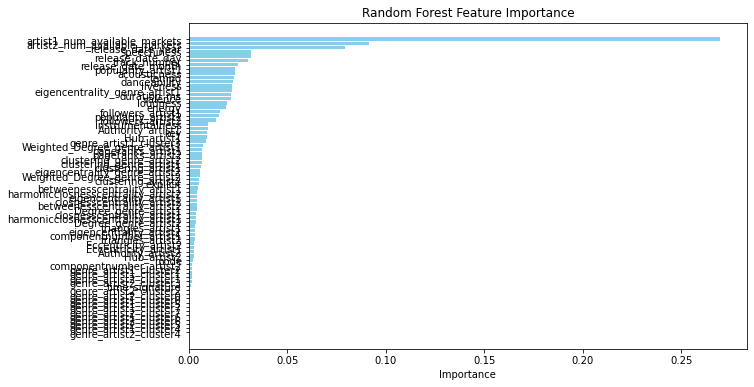

Feature Importance:
                          Feature    Importance
19  artist1_num_available_markets  2.697426e-01
20  artist2_num_available_markets  9.155322e-02
21              release_date_year  7.910801e-02
12                    speechiness  3.153326e-02
23               release_date_day  3.153105e-02
..                            ...           ...
60         genre_artist1_cluster6  1.075405e-05
68         genre_artist2_cluster6  4.189595e-08
67         genre_artist2_cluster5  3.521103e-08
58         genre_artist1_cluster4  2.184326e-09
66         genre_artist2_cluster4  0.000000e+00

[70 rows x 2 columns]


In [79]:
# random forest feature importance

import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

# Initialize the model (Random Forest Regressor)
randome_forest_model = RandomForestRegressor(random_state=42)

# Fit the model
randome_forest_model.fit(X, y.replace({'low': 0, 'average': 1, 'high': 2}))

# Get feature importances
feature_importances = randome_forest_model.feature_importances_

# Create a DataFrame for feature importances
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort features by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('Random Forest Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to display the highest importance at the top
plt.show()

# Print feature importances
print("Feature Importance:")
print(feature_importance_df)

# Converting explicit categorical variable into numerical using pd.get_dummies

In [80]:
# pd.get dummies on explicit columns
X_train=pd.get_dummies(X_train,columns=["explicit"])
X_train

,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7,explicit_False,explicit_True
4944,1,338660,2,0,4,0.12800,0.602,0.612,0.001870,0.2210,-7.074,0.0292,0.356,95.002,103240,52,29356,41,40.0,40.0,2018,12,5,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1183,2,220800,11,0,4,0.05350,0.649,0.597,0.000000,0.2010,-5.367,0.0911,0.347,149.980,460534,64,3765,62,79.0,79.0,2019,4,19,23.0,12.0,0.454545,0.045087,23.0,12.0,0.454545,0.045087,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
1049,1,176416,8,1,4,0.00548,0.605,0.664,0.000003,0.2040,-7.162,0.0316,0.164,103.997,794013,79,15948075,90,79.0,70.0,2019,5,30,4873.0,220.0,0.153198,0.925226,4873.0,220.0,0.153198,0.925226,0.190476,0.089858,4.0,7.0,0.273364,0.293815,826.499107,0.0,0.001472,0.009684,0.009684,0.133333,0.376225,14.0,6.0,0.338258,0.371285,4530.223112,0.0,0.002201,0.071356,0.071356,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
1330,6,237586,7,1,4,0.23200,0.776,0.758,0.000000,0.1240,-6.636,0.2900,0.354,145.968,2262360,75,1054676,69,22.0,62.0,2018,3,23,23.0,12.0,0.454545,0.045087,38.0,15.0,0.752381,0.131924,0.000000,0.005902,0.0,1.0,1.000000,1.000000,0.000000,40.0,0.001135,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
2223,1,196400,4,0,4,0.01750,0.669,0.574,0.002940,0.1460,-6.442,0.0286,0.273,120.013,3591545,87,19142628,92,53.0,66.0,2018,9,19,296.0,59.0,0.458560,0.349174,296.0,59.0,0.458560,0.349174,0.166667,0.052242,1.0,7.0,0.254699,0.274426,758.252294,0.0,0.000904,0.003519,0.003519,0.081871,0.259858,14.0,6.0,0.311445,0.345105,6668.192513,0.0,0.003880,0.031097,0.031097,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4426,1,120346,8,0,4,0.50100,0.666,0.671,0.000004,0.3160,-8.522,0.0577,0.964,180.096,5556,42,77,29,0.0,0.0,2019,7,12,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,0,

In [81]:
X_train.drop(columns=["explicit_False"],axis=1, inplace=True)
X_train

,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7,explicit_True
4944,1,338660,2,0,4,0.12800,0.602,0.612,0.001870,0.2210,-7.074,0.0292,0.356,95.002,103240,52,29356,41,40.0,40.0,2018,12,5,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1183,2,220800,11,0,4,0.05350,0.649,0.597,0.000000,0.2010,-5.367,0.0911,0.347,149.980,460534,64,3765,62,79.0,79.0,2019,4,19,23.0,12.0,0.454545,0.045087,23.0,12.0,0.454545,0.045087,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1
1049,1,176416,8,1,4,0.00548,0.605,0.664,0.000003,0.2040,-7.162,0.0316,0.164,103.997,794013,79,15948075,90,79.0,70.0,2019,5,30,4873.0,220.0,0.153198,0.925226,4873.0,220.0,0.153198,0.925226,0.190476,0.089858,4.0,7.0,0.273364,0.293815,826.499107,0.0,0.001472,0.009684,0.009684,0.133333,0.376225,14.0,6.0,0.338258,0.371285,4530.223112,0.0,0.002201,0.071356,0.071356,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1330,6,237586,7,1,4,0.23200,0.776,0.758,0.000000,0.1240,-6.636,0.2900,0.354,145.968,2262360,75,1054676,69,22.0,62.0,2018,3,23,23.0,12.0,0.454545,0.045087,38.0,15.0,0.752381,0.131924,0.000000,0.005902,0.0,1.0,1.000000,1.000000,0.000000,40.0,0.001135,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1
2223,1,196400,4,0,4,0.01750,0.669,0.574,0.002940,0.1460,-6.442,0.0286,0.273,120.013,3591545,87,19142628,92,53.0,66.0,2018,9,19,296.0,59.0,0.458560,0.349174,296.0,59.0,0.458560,0.349174,0.166667,0.052242,1.0,7.0,0.254699,0.274426,758.252294,0.0,0.000904,0.003519,0.003519,0.081871,0.259858,14.0,6.0,0.311445,0.345105,6668.192513,0.0,0.003880,0.031097,0.031097,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4426,1,120346,8,0,4,0.50100,0.666,0.671,0.000004,0.3160,-8.522,0.0577,0.964,180.096,5556,42,77,29,0.0,0.0,2019,7,12,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0

In [82]:
# pd.get dummies on explicit columns
X_test=pd.get_dummies(X_test,columns=["explicit"])
X_test.drop(columns=["explicit_False"],axis=1, inplace=True)
X_test

,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7,explicit_True
584,1,195000,6,0,4,0.2760,0.639,0.536,0.000000,0.0846,-6.328,0.0963,0.2650,139.902,197960,67,368987,70,54.0,59.0,2018,3,30,296.0,28.0,0.350427,0.129585,35.0,14.0,0.461538,0.050879,1.000000,0.039964,6.0,6.0,0.368421,0.446190,0.000000,1.0,0.000947,0.000000,0.000000,1.000000,0.039964,6.0,6.0,0.368421,0.446190,0.000000,1.0,0.000947,0.000000,0.000000,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1
1215,1,180609,1,1,4,0.0681,0.809,0.871,0.000000,0.1110,-4.525,0.2800,0.5730,154.957,2444602,80,17479503,91,57.0,54.0,2019,9,26,1739.0,102.0,0.367129,0.560996,4873.0,220.0,0.153198,0.925226,0.333333,0.159793,7.0,7.0,0.295505,0.322418,529.939917,0.0,0.001317,0.022177,0.022177,0.087395,0.703729,52.0,6.0,0.365438,0.410191,19475.553644,0.0,0.006500,0.117326,0.117326,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
877,7,160320,1,1,4,0.3540,0.799,0.381,0.000003,0.1350,-7.147,0.4640,0.0488,158.021,7771400,86,1562066,85,71.0,64.0,2017,10,30,2025.0,97.0,0.373684,0.534541,2025.0,97.0,0.373684,0.534541,0.315789,0.518700,60.0,7.0,0.323114,0.360607,1912.288502,0.0,0.004087,0.093912,0.093912,0.267974,0.444304,41.0,6.0,0.321083,0.356426,3651.532097,0.0,0.003596,0.078077,0.078077,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
4230,1,203906,7,1,4,0.0039,0.626,0.938,0.000452,0.5990,-3.005,0.0944,0.5180,124.932,1100976,77,40537,69,78.0,38.0,2016,12,2,4873.0,220.0,0.153198,0.925226,615.0,80.0,0.424213,0.457425,0.000000,0.012954,0.0,2.0,0.666667,0.750000,3.000000,49.0,0.001207,0.000000,0.000000,0.400000,0.056957,4.0,6.0,0.263388,0.280070,898.886483,0.0,0.001370,0.004514,0.004514,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4159,1,129680,5,0,5,0.7010,0.275,0.386,0.000000,0.1290,-10.473,0.0327,0.2660,152.790,561,53,199964,55,24.0,0.0,2017,8,25,0.0,0.0,0.000000,0.000000,38.0,15.0,0.752381,0.131924,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,2,158554,11,0,4,0.5580,0.671,0.557,0.000000,0.1010,-7.710,0.2340,0.4140,93.996,1269136,80,1140736,80,48.0,50.0,2018,10,5,296.0,28.0,0.350427,0.129585,296.0,28.0,0.350427,0.129585,0.380952,0.057158,8.0,7.0,0.315315,0.444558,40.500000,1.0,0.002830,0.000000,0.000000,0.333333,0.040754,2.0,6.0,0.380435,0.460476,43.466667,1.0,0.001833,0.000000,0.000000,0,0,0

## Standardization

In [83]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# transform data
scaled_x_train = scaler.fit_transform(X_train)
scaled_x_train = pd.DataFrame(scaled_x_train, columns =X_train.columns)
print("Scaled x_trains shape:",scaled_x_train.shape)
scaled_x_test = scaler.fit_transform(X_test)
scaled_x_test = pd.DataFrame(scaled_x_test, columns =X_train.columns)
print("Scaled x_test shape:",scaled_x_test.shape)

Scaled x_trains shape: (4143, 70)
Scaled x_test shape: (1036, 70)


In [84]:
scaled_x_train

,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7,explicit_True
0,-0.773058,3.111515,-0.910590,-0.992545,0.023717,-0.434051,-0.867379,-0.481789,-0.066338,0.259404,-0.516944,-1.101618,-0.753092,-0.981919,-0.492744,-1.452970,-0.516177,-1.871030,-0.728848,-0.811909,0.108625,1.541663,-1.212822,-0.595684,-0.850465,-1.589130,-0.958407,-0.575275,-0.812389,-1.404656,-0.914201,-0.573778,-0.588821,-0.456432,-1.027885,-0.861871,-0.901249,-0.438788,-0.245424,-0.747682,-0.477231,-0.477231,-0.603482,-0.586295,-0.463427,-1.076614,-0.897627,-0.938963,-0.431198,-0.242525,-0.720011,-0.493630,-0.493630,3.025626,-0.935687,-0.379683,-0.662225,0.0,-0.026919,-0.026919,-0.049189,2.297232,-0.904821,-0.365822,-0.606819,0.0,-0.015538,-0.021977,-0.051596,-1.144837
1,-0.569565,0.335467,1.531732,-0.992545,0.023717,-0.804175,-0.501709,-0.589275,-0.111946,0.127032,0.325405,-0.621830,-0.796472,0.995487,-0.448441,-0.611619,-0.519887,-0.583070,0.922836,1.051738,0.467219,-0.912322,0.339627,-0.584458,-0.687967,0.141254,-0.814730,-0.564302,-0.645905,0.239974,-0.767984,-0.573778,-0.588821,-0.456432,-1.027885,-0.861871,-0.901249,-0.438788,-0.245424,-0.747682,-0.477231,-0.477231,-0.603482,-0.586295,-0.463427,-1.076614,-0.897627,-0.938963,-0.431198,-0.242525,-0.720011,-0.493630,-0.493630,-0.330510,-0.935687,-0.379683,1.510061,0.0,-0.026919,-0.026919,-0.049189,-0.435307,-0.904821,-0.365822,1.647937,0.0,-0.015538,-0.021977,-0.051596,0.873487
2,-0.773058,-0.709944,0.717625,1.007511,0.023717,-1.042743,-0.844038,-0.109171,-0.111873,0.146888,-0.560369,-1.083015,-1.678536,-0.658394,-0.407091,0.440069,1.791190,1.134209,0.922836,0.621665,0.467219,-0.605574,1.559407,1.782841,2.128669,-1.005928,1.989968,1.749606,2.239820,-0.850356,2.086301,0.167028,-0.101395,-0.252402,1.135216,0.212939,0.202281,-0.195704,-0.245424,0.088840,-0.206738,-0.206738,-0.088537,1.216117,0.135510,0.766024,0.477431,0.498388,0.775177,-0.242525,0.444769,1.206175,1.206175,-0.330510,1.068734,-0.379683,-0.662225,0.0,-0.026919,-0.026919,-0.049189,-0.435307,1.105191,-0.365822,-0.606819,0.0,-0.015538,-0.021977,-0.051596,-1.144837
3,0.244408,0.730841,0.446256,1.007511,0.023717,0.082631,0.486376,0.564408,-0.111946,-0.382599,-0.300805,0.919844,-0.762732,0.851187,-0.225020,0.159619,-0.367561,-0.153750,-1.491164,0.239379,0.108625,-1.219070,0.783183,-0.584458,-0.687967,0.141254,-0.814730,-0.557146,-0.604284,1.317602,-0.486372,-0.573778,-0.556806,-0.456432,-0.718870,3.069919,2.854618,-0.438788,3.916644,-0.102674,-0.477231,-0.477231,-0.603482,-0.586295,-0.463427,-1.076614,-0.897627,-0.938963,-0.431198,-0.242525,-0.720011,-0.493630,-0.493630,-0.330510,-0.935687,-0.379683,1.510061,0.0,-0.026919,-0.

In [85]:
scaled_x_test

,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7,explicit_True
0,-0.754975,-0.251133,0.169325,-0.956542,-0.006780,0.261292,-0.559619,-0.981021,-0.114613,-0.660001,-0.130694,-0.605170,-1.125367,0.595228,-0.500476,-0.444353,-0.455337,-0.046879,-0.116770,0.064082,0.100183,-1.125727,1.567608,-0.440669,-0.466725,-0.262334,-0.541274,-0.557958,-0.632549,0.290489,-0.764440,3.242494,-0.356873,-0.151341,0.855303,0.532695,0.708438,-0.422462,-0.174771,-0.195760,-0.456365,-0.456365,3.148144,-0.370201,-0.176774,0.821369,0.598277,0.782111,-0.415739,-0.138636,-0.185684,-0.475968,-0.475968,-0.304675,-0.914811,2.616961,-0.697402,-0.031083,-0.031083,0.0,-0.05389,-0.419448,-0.898904,-0.351631,1.569995,-0.031083,-0.031083,0.0,-0.05389,0.850761
1,-0.754975,-0.549736,-1.184230,1.045433,-0.006780,-0.757713,0.760253,1.379867,-0.114613,-0.486214,0.735080,0.850320,0.337299,1.120691,-0.192621,0.529853,2.047723,1.257342,0.006296,-0.178036,0.343251,0.675436,1.121504,0.272818,0.559577,-0.196106,0.862262,1.922785,2.321609,-0.879251,2.137021,0.683180,0.294571,-0.102344,1.168189,0.255808,0.260473,-0.263321,-0.266682,0.022083,0.146401,0.146401,-0.275210,2.925071,1.915716,0.821369,0.586405,0.645729,5.013707,-0.248610,2.896903,2.459666,2.459666,-0.304675,1.093122,-0.382123,-0.697402,-0.031083,-0.031083,0.0,-0.05389,-0.419448,1.112466,-0.351631,-0.636945,-0.031083,-0.031083,0.0,-0.05389,0.850761
2,0.465869,-0.970718,-1.184230,1.045433,-0.006780,0.643603,0.682613,-2.073371,-0.114531,-0.328226,-0.523966,2.308187,-2.152083,1.227634,0.537305,0.979487,-0.280804,0.884707,0.580604,0.306199,-0.142884,0.975630,1.567608,0.414230,0.490233,-0.170113,0.776195,0.462438,0.557718,-0.042800,0.840559,0.615829,2.245751,2.494472,1.168189,0.360649,0.398689,0.151799,-0.266682,1.652956,2.096143,2.096143,0.402176,1.637152,1.415338,0.821369,0.409889,0.442040,0.602245,-0.248610,1.284832,1.477610,1.477610,-0.304675,1.093122,-0.382123,-0.697402,-0.031083,-0.031083,0.0,-0.05389,-0.419448,1.112466,-0.351631,-0.636945,-0.031083,-0.031083,0.0,-0.05389,0.850761
3,-0.754975,-0.066340,0.440036,1.045433,-0.006780,-1.072384,-0.660550,1.852044,-0.102836,2.726209,1.464962,-0.620224,0.076108,0.072732,-0.376737,0.305036,-0.503385,-0.108985,0.867758,-0.952811,-0.385952,1.576018,-1.555121,1.822415,2.196113,-1.044409,2.047235,-0.260556,0.313928,0.148890,0.584655,-0.596475,-0.503711,-0.445320,-0.396242,1.665240,1.808011,-0.421561,4.236920,-0.042681,-0.456365,-0.456365,0.897430,-0.285839,-0.267752,0.821369,0.180284,0.152766,-0.165145,-0.248610,0.049132,-0.363022,-0.363022,-0.304675,1.093122,-0.382123,-0.697402,-0.031083,-0.031083,0.0,-0.05389,-0.419448,1.112466,-0.351631,-0.636945,-

## Multicollinearity

In [86]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data1 = pd.DataFrame()
vif_data1['feature'] = X_train.columns
vif_data1['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(len(X_train.columns))]
vif_data1=(vif_data1.sort_values(by=["VIF"],ascending=False))

/Users/anushkavuppala/opt/anaconda3/lib/python3.9/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)
/Users/anushkavuppala/opt/anaconda3/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:1736: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


In [87]:
vif_data1

,feature,VIF
55,genre_artist1_cluster2,inf
60,genre_artist1_cluster7,inf
51,Authority_artist2,inf
40,Authority_artist1,inf
41,Hub_artist1,inf
...,...,...
21,release_date_month,1.045286
22,release_date_day,1.040497
4,time_signature,1.033112
57,genre_artist1_cluster4,NaN


# Classification conversion

In [88]:
y_train.describe()

count    4143.000000
mean       46.917692
std        24.427174
min         0.000000
25%        37.000000
50%        53.000000
75%        64.000000
max        98.000000
Name: song_popularity, dtype: float64

In [89]:
bins = [0, 40, 60, 98] 
labels = ['low', 'average', 'high']

# Create the new categorical column
y_train = pd.cut(y_train, bins=bins, labels=labels,include_lowest=True)
y_test = pd.cut(y_test, bins=bins, labels=labels,include_lowest=True)

# Display the updated DataFrame
y_train

4944        low
1183    average
1049       high
1330    average
2223        low
         ...   
4426        low
466        high
3092        low
3772    average
860     average
Name: song_popularity, Length: 4143, dtype: category
Categories (3, object): ['low' < 'average' < 'high']

In [90]:
y_train.value_counts()

average    1549
high       1400
low        1194
Name: song_popularity, dtype: int64

In [91]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report


model = LogisticRegression(max_iter=1000)  # You may choose a different classification algorithm

# Fit the model on the training data
model.fit(scaled_x_train, y_train)

# Make predictions on the test data
y_pred = model.predict(scaled_x_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy and a classification report
print("Accuracy:", accuracy)
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6245173745173745
Classification Report:
               precision    recall  f1-score   support

     average       0.65      0.64      0.64       431
        high       0.58      0.68      0.63       317
         low       0.65      0.55      0.60       288

    accuracy                           0.62      1036
   macro avg       0.63      0.62      0.62      1036
weighted avg       0.63      0.62      0.62      1036



In [92]:
scaled_x_train#[remaining_columns]

,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7,explicit_True
0,-0.773058,3.111515,-0.910590,-0.992545,0.023717,-0.434051,-0.867379,-0.481789,-0.066338,0.259404,-0.516944,-1.101618,-0.753092,-0.981919,-0.492744,-1.452970,-0.516177,-1.871030,-0.728848,-0.811909,0.108625,1.541663,-1.212822,-0.595684,-0.850465,-1.589130,-0.958407,-0.575275,-0.812389,-1.404656,-0.914201,-0.573778,-0.588821,-0.456432,-1.027885,-0.861871,-0.901249,-0.438788,-0.245424,-0.747682,-0.477231,-0.477231,-0.603482,-0.586295,-0.463427,-1.076614,-0.897627,-0.938963,-0.431198,-0.242525,-0.720011,-0.493630,-0.493630,3.025626,-0.935687,-0.379683,-0.662225,0.0,-0.026919,-0.026919,-0.049189,2.297232,-0.904821,-0.365822,-0.606819,0.0,-0.015538,-0.021977,-0.051596,-1.144837
1,-0.569565,0.335467,1.531732,-0.992545,0.023717,-0.804175,-0.501709,-0.589275,-0.111946,0.127032,0.325405,-0.621830,-0.796472,0.995487,-0.448441,-0.611619,-0.519887,-0.583070,0.922836,1.051738,0.467219,-0.912322,0.339627,-0.584458,-0.687967,0.141254,-0.814730,-0.564302,-0.645905,0.239974,-0.767984,-0.573778,-0.588821,-0.456432,-1.027885,-0.861871,-0.901249,-0.438788,-0.245424,-0.747682,-0.477231,-0.477231,-0.603482,-0.586295,-0.463427,-1.076614,-0.897627,-0.938963,-0.431198,-0.242525,-0.720011,-0.493630,-0.493630,-0.330510,-0.935687,-0.379683,1.510061,0.0,-0.026919,-0.026919,-0.049189,-0.435307,-0.904821,-0.365822,1.647937,0.0,-0.015538,-0.021977,-0.051596,0.873487
2,-0.773058,-0.709944,0.717625,1.007511,0.023717,-1.042743,-0.844038,-0.109171,-0.111873,0.146888,-0.560369,-1.083015,-1.678536,-0.658394,-0.407091,0.440069,1.791190,1.134209,0.922836,0.621665,0.467219,-0.605574,1.559407,1.782841,2.128669,-1.005928,1.989968,1.749606,2.239820,-0.850356,2.086301,0.167028,-0.101395,-0.252402,1.135216,0.212939,0.202281,-0.195704,-0.245424,0.088840,-0.206738,-0.206738,-0.088537,1.216117,0.135510,0.766024,0.477431,0.498388,0.775177,-0.242525,0.444769,1.206175,1.206175,-0.330510,1.068734,-0.379683,-0.662225,0.0,-0.026919,-0.026919,-0.049189,-0.435307,1.105191,-0.365822,-0.606819,0.0,-0.015538,-0.021977,-0.051596,-1.144837
3,0.244408,0.730841,0.446256,1.007511,0.023717,0.082631,0.486376,0.564408,-0.111946,-0.382599,-0.300805,0.919844,-0.762732,0.851187,-0.225020,0.159619,-0.367561,-0.153750,-1.491164,0.239379,0.108625,-1.219070,0.783183,-0.584458,-0.687967,0.141254,-0.814730,-0.557146,-0.604284,1.317602,-0.486372,-0.573778,-0.556806,-0.456432,-0.718870,3.069919,2.854618,-0.438788,3.916644,-0.102674,-0.477231,-0.477231,-0.603482,-0.586295,-0.463427,-1.076614,-0.897627,-0.938963,-0.431198,-0.242525,-0.720011,-0.493630,-0.493630,-0.330510,-0.935687,-0.379683,1.510061,0.0,-0.026919,-0.

In [93]:
y_train.replace({'low': 0, 'average': 1, 'high': 2}, inplace=True)
y_test.replace({'low': 0, 'average': 1, 'high': 2}, inplace=True)
y_train

4944    0
1183    1
1049    2
1330    1
2223    0
       ..
4426    0
466     2
3092    0
3772    1
860     1
Name: song_popularity, Length: 4143, dtype: category
Categories (3, int64): [0 < 1 < 2]

## XGBOOST CLASSIFIER

In [94]:
X_train

,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7,explicit_True
4944,1,338660,2,0,4,0.12800,0.602,0.612,0.001870,0.2210,-7.074,0.0292,0.356,95.002,103240,52,29356,41,40.0,40.0,2018,12,5,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1183,2,220800,11,0,4,0.05350,0.649,0.597,0.000000,0.2010,-5.367,0.0911,0.347,149.980,460534,64,3765,62,79.0,79.0,2019,4,19,23.0,12.0,0.454545,0.045087,23.0,12.0,0.454545,0.045087,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1
1049,1,176416,8,1,4,0.00548,0.605,0.664,0.000003,0.2040,-7.162,0.0316,0.164,103.997,794013,79,15948075,90,79.0,70.0,2019,5,30,4873.0,220.0,0.153198,0.925226,4873.0,220.0,0.153198,0.925226,0.190476,0.089858,4.0,7.0,0.273364,0.293815,826.499107,0.0,0.001472,0.009684,0.009684,0.133333,0.376225,14.0,6.0,0.338258,0.371285,4530.223112,0.0,0.002201,0.071356,0.071356,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1330,6,237586,7,1,4,0.23200,0.776,0.758,0.000000,0.1240,-6.636,0.2900,0.354,145.968,2262360,75,1054676,69,22.0,62.0,2018,3,23,23.0,12.0,0.454545,0.045087,38.0,15.0,0.752381,0.131924,0.000000,0.005902,0.0,1.0,1.000000,1.000000,0.000000,40.0,0.001135,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1
2223,1,196400,4,0,4,0.01750,0.669,0.574,0.002940,0.1460,-6.442,0.0286,0.273,120.013,3591545,87,19142628,92,53.0,66.0,2018,9,19,296.0,59.0,0.458560,0.349174,296.0,59.0,0.458560,0.349174,0.166667,0.052242,1.0,7.0,0.254699,0.274426,758.252294,0.0,0.000904,0.003519,0.003519,0.081871,0.259858,14.0,6.0,0.311445,0.345105,6668.192513,0.0,0.003880,0.031097,0.031097,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4426,1,120346,8,0,4,0.50100,0.666,0.671,0.000004,0.3160,-8.522,0.0577,0.964,180.096,5556,42,77,29,0.0,0.0,2019,7,12,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0

In [95]:
import xgboost as xgb
import pickle
from sklearn import datasets
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

model = XGBClassifier()

model.fit(X_train, y_train)

# cheking training accuracy
y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = accuracy_score(y_test,predictions)
accuracy

0.6756756756756757

In [96]:
print(model.feature_importances_)


[0.01159746 0.0082565  0.00796694 0.00832978 0.01213259 0.00782998
 0.00827259 0.00813148 0.00703347 0.00829241 0.00826246 0.00863335
 0.00791831 0.00812341 0.01038556 0.01984993 0.01135602 0.0186182
 0.04713605 0.02792023 0.0389401  0.00969006 0.00845768 0.01222403
 0.012998   0.00985782 0.02108495 0.00813776 0.00824726 0.00862616
 0.00650509 0.01139119 0.00972013 0.01551754 0.01526645 0.01001822
 0.0105989  0.01234448 0.01018086 0.01314121 0.18224166 0.
 0.00828752 0.00986879 0.00932103 0.00843458 0.01029816 0.00971183
 0.00773039 0.0125329  0.01628234 0.021176   0.         0.
 0.01390967 0.00974324 0.09015723 0.         0.         0.
 0.         0.00811418 0.00636506 0.00670306 0.03879123 0.
 0.         0.         0.         0.02133651]


In [97]:
from sklearn.model_selection import GridSearchCV
param_grid={
   
    'learning_rate':[1,0.5,0.1,0.01,0.001],
    'max_depth': [3,5,10,20],
    'n_estimators':[10,50,100,200,300,400]
    
}
grid= GridSearchCV(XGBClassifier(),param_grid, verbose=3)
grid.fit(X_train,y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV 1/5] END learning_rate=1, max_depth=3, n_estimators=10;, score=0.649 total time=   0.1s
[CV 2/5] END learning_rate=1, max_depth=3, n_estimators=10;, score=0.686 total time=   0.1s
[CV 3/5] END learning_rate=1, max_depth=3, n_estimators=10;, score=0.648 total time=   0.1s
[CV 4/5] END learning_rate=1, max_depth=3, n_estimators=10;, score=0.673 total time=   0.1s
[CV 5/5] END learning_rate=1, max_depth=3, n_estimators=10;, score=0.646 total time=   0.1s
[CV 1/5] END learning_rate=1, max_depth=3, n_estimators=50;, score=0.642 total time=   0.4s
[CV 2/5] END learning_rate=1, max_depth=3, n_estimators=50;, score=0.686 total time=   0.3s
[CV 3/5] END learning_rate=1, max_depth=3, n_estimators=50;, score=0.656 total time=   0.3s
[CV 4/5] END learning_rate=1, max_depth=3, n_estimators=50;, score=0.661 total time=   0.3s
[CV 5/5] END learning_rate=1, max_depth=3, n_estimators=50;, score=0.640 total time=   0.2s
[CV 1/5] END lear

[CV 4/5] END learning_rate=1, max_depth=10, n_estimators=400;, score=0.675 total time=   4.3s
[CV 5/5] END learning_rate=1, max_depth=10, n_estimators=400;, score=0.643 total time=   4.6s
[CV 1/5] END learning_rate=1, max_depth=20, n_estimators=10;, score=0.626 total time=   0.4s
[CV 2/5] END learning_rate=1, max_depth=20, n_estimators=10;, score=0.686 total time=   0.3s
[CV 3/5] END learning_rate=1, max_depth=20, n_estimators=10;, score=0.637 total time=   0.3s
[CV 4/5] END learning_rate=1, max_depth=20, n_estimators=10;, score=0.656 total time=   0.3s
[CV 5/5] END learning_rate=1, max_depth=20, n_estimators=10;, score=0.644 total time=   0.3s
[CV 1/5] END learning_rate=1, max_depth=20, n_estimators=50;, score=0.633 total time=   1.0s
[CV 2/5] END learning_rate=1, max_depth=20, n_estimators=50;, score=0.694 total time=   1.1s
[CV 3/5] END learning_rate=1, max_depth=20, n_estimators=50;, score=0.630 total time=   1.1s
[CV 4/5] END learning_rate=1, max_depth=20, n_estimators=50;, score=

[CV 1/5] END learning_rate=0.5, max_depth=5, n_estimators=400;, score=0.637 total time=   3.5s
[CV 2/5] END learning_rate=0.5, max_depth=5, n_estimators=400;, score=0.698 total time=   3.5s
[CV 3/5] END learning_rate=0.5, max_depth=5, n_estimators=400;, score=0.637 total time=   3.7s
[CV 4/5] END learning_rate=0.5, max_depth=5, n_estimators=400;, score=0.668 total time=   3.7s
[CV 5/5] END learning_rate=0.5, max_depth=5, n_estimators=400;, score=0.653 total time=   3.5s
[CV 1/5] END learning_rate=0.5, max_depth=10, n_estimators=10;, score=0.641 total time=   0.2s
[CV 2/5] END learning_rate=0.5, max_depth=10, n_estimators=10;, score=0.691 total time=   0.2s
[CV 3/5] END learning_rate=0.5, max_depth=10, n_estimators=10;, score=0.628 total time=   0.2s
[CV 4/5] END learning_rate=0.5, max_depth=10, n_estimators=10;, score=0.650 total time=   0.2s
[CV 5/5] END learning_rate=0.5, max_depth=10, n_estimators=10;, score=0.649 total time=   0.2s
[CV 1/5] END learning_rate=0.5, max_depth=10, n_es

[CV 2/5] END learning_rate=0.1, max_depth=3, n_estimators=300;, score=0.703 total time=   1.7s
[CV 3/5] END learning_rate=0.1, max_depth=3, n_estimators=300;, score=0.653 total time=   1.9s
[CV 4/5] END learning_rate=0.1, max_depth=3, n_estimators=300;, score=0.686 total time=   1.7s
[CV 5/5] END learning_rate=0.1, max_depth=3, n_estimators=300;, score=0.657 total time=   1.7s
[CV 1/5] END learning_rate=0.1, max_depth=3, n_estimators=400;, score=0.667 total time=   2.3s
[CV 2/5] END learning_rate=0.1, max_depth=3, n_estimators=400;, score=0.698 total time=   2.4s
[CV 3/5] END learning_rate=0.1, max_depth=3, n_estimators=400;, score=0.653 total time=   2.4s
[CV 4/5] END learning_rate=0.1, max_depth=3, n_estimators=400;, score=0.676 total time=   2.3s
[CV 5/5] END learning_rate=0.1, max_depth=3, n_estimators=400;, score=0.653 total time=   2.5s
[CV 1/5] END learning_rate=0.1, max_depth=5, n_estimators=10;, score=0.644 total time=   0.1s
[CV 2/5] END learning_rate=0.1, max_depth=5, n_esti

[CV 4/5] END learning_rate=0.1, max_depth=20, n_estimators=200;, score=0.671 total time=   4.9s
[CV 5/5] END learning_rate=0.1, max_depth=20, n_estimators=200;, score=0.649 total time=   5.0s
[CV 1/5] END learning_rate=0.1, max_depth=20, n_estimators=300;, score=0.662 total time=   6.9s
[CV 2/5] END learning_rate=0.1, max_depth=20, n_estimators=300;, score=0.696 total time=   6.8s
[CV 3/5] END learning_rate=0.1, max_depth=20, n_estimators=300;, score=0.655 total time=   6.9s
[CV 4/5] END learning_rate=0.1, max_depth=20, n_estimators=300;, score=0.669 total time=   6.7s
[CV 5/5] END learning_rate=0.1, max_depth=20, n_estimators=300;, score=0.644 total time=   7.1s
[CV 1/5] END learning_rate=0.1, max_depth=20, n_estimators=400;, score=0.662 total time=   8.3s
[CV 2/5] END learning_rate=0.1, max_depth=20, n_estimators=400;, score=0.695 total time=   8.6s
[CV 3/5] END learning_rate=0.1, max_depth=20, n_estimators=400;, score=0.657 total time=   8.2s
[CV 4/5] END learning_rate=0.1, max_dept

[CV 5/5] END learning_rate=0.01, max_depth=10, n_estimators=100;, score=0.622 total time=   2.3s
[CV 1/5] END learning_rate=0.01, max_depth=10, n_estimators=200;, score=0.648 total time=   4.7s
[CV 2/5] END learning_rate=0.01, max_depth=10, n_estimators=200;, score=0.679 total time=   4.9s
[CV 3/5] END learning_rate=0.01, max_depth=10, n_estimators=200;, score=0.649 total time=   4.6s
[CV 4/5] END learning_rate=0.01, max_depth=10, n_estimators=200;, score=0.669 total time=   4.8s
[CV 5/5] END learning_rate=0.01, max_depth=10, n_estimators=200;, score=0.630 total time=   4.6s
[CV 1/5] END learning_rate=0.01, max_depth=10, n_estimators=300;, score=0.650 total time=   7.3s
[CV 2/5] END learning_rate=0.01, max_depth=10, n_estimators=300;, score=0.696 total time=   7.9s
[CV 3/5] END learning_rate=0.01, max_depth=10, n_estimators=300;, score=0.645 total time=   7.1s
[CV 4/5] END learning_rate=0.01, max_depth=10, n_estimators=300;, score=0.682 total time=   6.9s
[CV 5/5] END learning_rate=0.0

[CV 5/5] END learning_rate=0.001, max_depth=5, n_estimators=50;, score=0.633 total time=   0.6s
[CV 1/5] END learning_rate=0.001, max_depth=5, n_estimators=100;, score=0.628 total time=   1.1s
[CV 2/5] END learning_rate=0.001, max_depth=5, n_estimators=100;, score=0.645 total time=   1.1s
[CV 3/5] END learning_rate=0.001, max_depth=5, n_estimators=100;, score=0.612 total time=   1.1s
[CV 4/5] END learning_rate=0.001, max_depth=5, n_estimators=100;, score=0.647 total time=   1.1s
[CV 5/5] END learning_rate=0.001, max_depth=5, n_estimators=100;, score=0.633 total time=   1.1s
[CV 1/5] END learning_rate=0.001, max_depth=5, n_estimators=200;, score=0.632 total time=   2.3s
[CV 2/5] END learning_rate=0.001, max_depth=5, n_estimators=200;, score=0.648 total time=   2.1s
[CV 3/5] END learning_rate=0.001, max_depth=5, n_estimators=200;, score=0.625 total time=   2.1s
[CV 4/5] END learning_rate=0.001, max_depth=5, n_estimators=200;, score=0.644 total time=   2.1s
[CV 5/5] END learning_rate=0.00

GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_b...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             param_grid={'learning_rate': [1, 0.5, 0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 10, 20],
                         'n_estimators': [10, 50, 100, 200, 300, 400]},
             verbose=3)

In [98]:
grid.best_params_

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}

In [147]:
# Create new model using the same parameters
new_model=XGBClassifier(learning_rate= 0.1, max_depth= 10, n_estimators= 300)
new_model.fit(X_train, y_train)
y_pred_new = new_model.predict(X_test)
predictions_new = [round(value) for value in y_pred_new]
accuracy_new = accuracy_score(y_test,predictions_new)
accuracy_new

0.6805019305019305

In [100]:

y_pred_new = new_model.predict(X_train)
predictions_new = [round(value) for value in y_pred_new]
accuracy_new = accuracy_score(y_train,predictions_new)
accuracy_new

0.9949312092686459

In [101]:
print("Classification Report:\n", classification_report(y_test, new_model.predict(X_test)))

Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.70      0.68       288
           1       0.71      0.68      0.69       431
           2       0.66      0.67      0.66       317

    accuracy                           0.68      1036
   macro avg       0.68      0.68      0.68      1036
weighted avg       0.68      0.68      0.68      1036



Confusion Matrix:
[[202  49  37]
 [ 65 292  74]
 [ 35  71 211]]


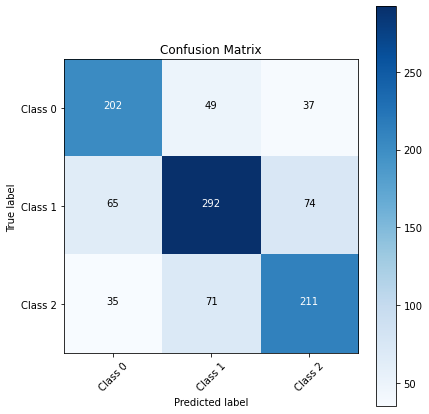

In [102]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, new_model.predict(X_test))

# Print the confusion matrix
print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(6, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(set(y_test)))
plt.xticks(tick_marks, ["Class 0", "Class 1", "Class 2"], rotation=45)
plt.yticks(tick_marks, ["Class 0", "Class 1", "Class 2"])
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Add count values as annotations
for i in range(len(tick_marks)):
    for j in range(len(tick_marks)):
        plt.text(j, i, str(cm[i, j]), horizontalalignment="center", color="white" if cm[i, j] > cm.max() / 2 else "black")

plt.show()

In [103]:
y_test.value_counts(normalize=True)

1    0.416023
2    0.305985
0    0.277992
Name: song_popularity, dtype: float64

In [104]:
y_train.value_counts(normalize=True)

1    0.373884
2    0.337919
0    0.288197
Name: song_popularity, dtype: float64

# CATBOOST

In [105]:
from catboost import CatBoostClassifier

catboost = CatBoostClassifier(silent=True)
catboost.fit(X_train,y_train)

# cheking training accuracy
y_pred = catboost.predict(X_test)
accuracy = accuracy_score(y_test,predictions)
accuracy

0.6756756756756757

In [106]:
#create the grid
grid = {'max_depth': [3,4,5,6,7,8,9],'n_estimators':[100, 200, 300]}

cbc = CatBoostClassifier(silent=True)

#instantiate  GridSearchCV
gscv = GridSearchCV (estimator = cbc, param_grid = grid, scoring = "roc_auc_ovr"
, cv = 5)

#fit the model using grid search
gscv.fit(X_train,y_train)

#returns the estimator with the best performance
print(gscv.best_estimator_)

#returns the best score
print(gscv.best_score_)

#returns the best parameters
print(gscv.best_params_)




0.8494784321583004
{'max_depth': 4, 'n_estimators': 300}


In [107]:
catboost_tuned = CatBoostClassifier(max_depth = 4,n_estimators=300,silent=True)
catboost_tuned.fit(X_train,y_train)

y_pred = catboost_tuned.predict(X_test)
accuracy = accuracy_score(y_test,predictions)
accuracy


0.6756756756756757

## LGBM

In [108]:
import lightgbm as lgb
lgbm = lgb.LGBMClassifier()
lgbm.fit(X_train, y_train)
# cheking training accuracy
y_pred = catboost.predict(X_test)
accuracy = accuracy_score(y_test,predictions)
accuracy

0.6756756756756757

In [109]:
from scipy.stats import randint as sp_randint
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
import warnings
warnings.filterwarnings("ignore")

param_test ={'num_leaves': sp_randint(6, 50), 
             
               "n_estimators" : [50,100,200,300]}

lgb_clf = lgb.LGBMClassifier(max_depth=7, random_state=314, silent=True, metric='None', n_jobs=4)
lgb_rs = RandomizedSearchCV(
    estimator=lgb_clf, param_distributions=param_test, 
    n_iter=100,
    scoring='roc_auc',
    cv=3,
    refit=True,
    random_state=314,
    verbose=True)

lgb_rs.fit(X_train,y_train)

print('Best score reached: {} with params: {} '.format(lgb_rs.best_score_, lgb_rs.best_params_))

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best score reached: nan with params: {'n_estimators': 50, 'num_leaves': 15} 


In [110]:
tunned_lgb=lgb.LGBMClassifier(n_estimators = 50,num_leaves = 15)
fit_params={"early_stopping_rounds":30, 
            "eval_metric" : 'auc_mu', 
            "eval_set" : [(X_test,y_test)],
            'eval_names': ['valid'],
            #'callbacks': [lgb.reset_parameter(learning_rate=learning_rate_010_decay_power_099)],
            'verbose': 100}

tunned_lgb.fit(X_train,y_train,**fit_params)
# cheking training accuracy
y_pred = catboost.predict(X_test)
accuracy = accuracy_score(y_test,predictions)
accuracy

Training until validation scores don't improve for 30 rounds
Did not meet early stopping. Best iteration is:
[50]	valid's auc_mu: 0.891636	valid's multi_logloss: 0.708141


0.6756756756756757

# KNN

In [111]:
# pip install --upgrade threadpoolctl

In [112]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)
knn.score(X_train,y_train)
from sklearn.metrics import accuracy_score, classification_report




In [113]:
y_pred = knn.predict(X_test)
print("The accuracy score is : ", accuracy_score(y_test,y_pred))



The accuracy score is :  0.4555984555984556


In [114]:
param_grid = { 'algorithm' : ['ball_tree', 'kd_tree', 'brute'],
               'leaf_size' : [18,20,25,27,30,32,34],
               'n_neighbors' : [3,5,7,9,10,11,12,13]
              }
gridsearch = GridSearchCV(knn, param_grid,verbose=3)
gridsearch.fit(X_train,y_train)

Fitting 5 folds for each of 168 candidates, totalling 840 fits
[CV 1/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3;, score=0.446 total time=   0.1s
[CV 2/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3;, score=0.480 total time=   0.1s
[CV 3/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3;, score=0.440 total time=   0.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3;, score=0.424 total time=   0.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=3;, score=0.407 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5;, score=0.450 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5;, score=0.451 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5;, score=0.446 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=18, n_neighbors=5;, score=0.429 total 

[CV 4/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=5;, score=0.446 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=5;, score=0.429 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=7;, score=0.458 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=7;, score=0.484 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=7;, score=0.450 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=7;, score=0.438 total time=   0.0s
[CV 5/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=7;, score=0.431 total time=   0.0s
[CV 1/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=9;, score=0.452 total time=   0.0s
[CV 2/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=9;, score=0.490 total time=   0.0s
[CV 3/5] END algorithm=ball_tree, leaf_size=25, n_neighbors=9;, score=0.441 total time=   0.0s
[CV 4/5] END algorithm=ball_tree, leaf_size=25, n_

[CV 1/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=9;, score=0.452 total time=   0.1s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=9;, score=0.490 total time=   0.1s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=9;, score=0.440 total time=   0.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=9;, score=0.457 total time=   0.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=9;, score=0.437 total time=   0.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=10;, score=0.455 total time=   0.1s
[CV 2/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=10;, score=0.490 total time=   0.1s
[CV 3/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=10;, score=0.440 total time=   0.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=10;, score=0.449 total time=   0.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=30, n_neighbors=10;, score=0.432 total time=   0.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=3

[CV 4/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=10;, score=0.449 total time=   0.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=10;, score=0.432 total time=   0.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=11;, score=0.457 total time=   0.1s
[CV 2/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=11;, score=0.499 total time=   0.1s
[CV 3/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=11;, score=0.435 total time=   0.1s
[CV 4/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=11;, score=0.461 total time=   0.1s
[CV 5/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=11;, score=0.436 total time=   0.1s
[CV 1/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=12;, score=0.467 total time=   0.1s
[CV 2/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=12;, score=0.499 total time=   0.1s
[CV 3/5] END algorithm=ball_tree, leaf_size=34, n_neighbors=12;, score=0.441 total time=   0.1s
[CV 4/5] END algorithm=ball_tree, leaf_s

[CV 2/5] END algorithm=kd_tree, leaf_size=20, n_neighbors=12;, score=0.499 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, n_neighbors=12;, score=0.441 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, n_neighbors=12;, score=0.455 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, n_neighbors=12;, score=0.423 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=20, n_neighbors=13;, score=0.448 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=20, n_neighbors=13;, score=0.493 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=20, n_neighbors=13;, score=0.450 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=20, n_neighbors=13;, score=0.461 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=20, n_neighbors=13;, score=0.435 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=25, n_neighbors=3;, score=0.446 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=25, n_neighbors=3;,

[CV 3/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=3;, score=0.440 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=3;, score=0.423 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=3;, score=0.407 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=5;, score=0.448 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=5;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=5;, score=0.450 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=5;, score=0.444 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=5;, score=0.429 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=7;, score=0.458 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=7;, score=0.484 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=30, n_neighbors=7;, score=0.

[CV 5/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=7;, score=0.431 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=9;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=9;, score=0.490 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=9;, score=0.440 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=9;, score=0.457 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=9;, score=0.437 total time=   0.0s
[CV 1/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=10;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=10;, score=0.490 total time=   0.0s
[CV 3/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=10;, score=0.441 total time=   0.0s
[CV 4/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=10;, score=0.448 total time=   0.0s
[CV 5/5] END algorithm=kd_tree, leaf_size=34, n_neighbors=10;, sco

[CV 3/5] END algorithm=brute, leaf_size=20, n_neighbors=11;, score=0.435 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, n_neighbors=11;, score=0.461 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, n_neighbors=11;, score=0.436 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, n_neighbors=12;, score=0.466 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, n_neighbors=12;, score=0.499 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, n_neighbors=12;, score=0.441 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=20, n_neighbors=12;, score=0.455 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=20, n_neighbors=12;, score=0.423 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=20, n_neighbors=13;, score=0.448 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=20, n_neighbors=13;, score=0.493 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=20, n_neighbors=13;, score=0.450 total t

[CV 5/5] END algorithm=brute, leaf_size=27, n_neighbors=13;, score=0.435 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, n_neighbors=3;, score=0.445 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, n_neighbors=3;, score=0.480 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, n_neighbors=3;, score=0.440 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, n_neighbors=3;, score=0.424 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, n_neighbors=3;, score=0.407 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=30, n_neighbors=5;, score=0.449 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=30, n_neighbors=5;, score=0.474 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=30, n_neighbors=5;, score=0.449 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=30, n_neighbors=5;, score=0.444 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=30, n_neighbors=5;, score=0.429 total time=   0.0

[CV 1/5] END algorithm=brute, leaf_size=34, n_neighbors=9;, score=0.454 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=34, n_neighbors=9;, score=0.490 total time=   0.1s
[CV 3/5] END algorithm=brute, leaf_size=34, n_neighbors=9;, score=0.441 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=34, n_neighbors=9;, score=0.457 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=34, n_neighbors=9;, score=0.437 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=34, n_neighbors=10;, score=0.455 total time=   0.0s
[CV 2/5] END algorithm=brute, leaf_size=34, n_neighbors=10;, score=0.490 total time=   0.0s
[CV 3/5] END algorithm=brute, leaf_size=34, n_neighbors=10;, score=0.441 total time=   0.0s
[CV 4/5] END algorithm=brute, leaf_size=34, n_neighbors=10;, score=0.449 total time=   0.0s
[CV 5/5] END algorithm=brute, leaf_size=34, n_neighbors=10;, score=0.432 total time=   0.0s
[CV 1/5] END algorithm=brute, leaf_size=34, n_neighbors=11;, score=0.457 total time= 

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [18, 20, 25, 27, 30, 32, 34],
                         'n_neighbors': [3, 5, 7, 9, 10, 11, 12, 13]},
             verbose=3)

In [115]:
gridsearch.best_params_


{'algorithm': 'ball_tree', 'leaf_size': 18, 'n_neighbors': 11}

In [116]:
knn_tuned = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size =18, n_neighbors =11)


In [117]:
knn_tuned.fit(X_train,y_train)
knn_tuned.score(X_train,y_train)


0.5556360125512914

In [118]:
knn_tuned.score(X_test,y_test)

0.4517374517374517

# Decision Tree

In [119]:
# pip install pydotplus

In [120]:
import graphviz #display 
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

#let's first visualize the tree on the data without doing any pre processing
clf = DecisionTreeClassifier()
clf.fit(X_train,y_train)

DecisionTreeClassifier()

In [121]:
feature_name=list(X_train.columns)
class_name = list(y_train.unique())
feature_name

['track_number',
 'duration_ms',
 'key',
 'mode',
 'time_signature',
 'acousticness',
 'danceability',
 'energy',
 'instrumentalness',
 'liveness',
 'loudness',
 'speechiness',
 'valence',
 'tempo',
 'followers_artist1',
 'popularity_artist1',
 'followers_artist2',
 'popularity_artist2',
 'artist1_num_available_markets',
 'artist2_num_available_markets',
 'release_date_year',
 'release_date_month',
 'release_date_day',
 'Weighted_Degree_genre_artist1',
 'Degree_genre_artist1',
 'clustering_genre_artist1',
 'eigencentrality_genre_artist1',
 'Weighted_Degree_genre_artist2',
 'Degree_genre_artist2',
 'clustering_genre_artist2',
 'eigencentrality_genre_artist2',
 'clustering_artist1',
 'eigencentrality_artist1',
 'triangles_artist1',
 'Eccentricity_artist1',
 'closnesscentrality_artist1',
 'harmonicclosnesscentrality_artist1',
 'betweenesscentrality_artist1',
 'componentnumber_artist1',
 'pageranks_artist1',
 'Authority_artist1',
 'Hub_artist1',
 'clustering_artist2',
 'eigencentrality_art

In [122]:
# create a dot_file which stores the tree structure
dot_data = export_graphviz(clf,feature_names = feature_name,rounded = True,filled = True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  
graph.write_png("myTree.png")
# Show graph
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.587401 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.587401 to fit



In [123]:
grid_param = {
    'criterion': ['gini', 'entropy'],
    'max_depth' : range(2,32,1),
    'min_samples_leaf' : range(1,10,1),
    'min_samples_split': range(2,10,1),
    'splitter' : ['best', 'random']
    
}
 
grid_search = GridSearchCV(estimator=clf,
                     param_grid=grid_param,
                     cv=5,
                    n_jobs =-1)

In [124]:
grid_search.fit(X_train,y_train) #high computation


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 32),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [125]:
best_parameters = grid_search.best_params_
print(best_parameters)

{'criterion': 'gini', 'max_depth': 6, 'min_samples_leaf': 5, 'min_samples_split': 9, 'splitter': 'best'}


In [126]:
grid_search.best_score_


0.634080115149502

In [144]:
clf = DecisionTreeClassifier(criterion = 'gini', max_depth =6, min_samples_leaf= 5, min_samples_split= 9, splitter ='best')
clf.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=6, min_samples_leaf=5, min_samples_split=9)

In [145]:
clf.score(X_test,y_test) # Overfitting


0.61003861003861

# Adaboost and Gradient Boost

In [129]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn import metrics

ada = AdaBoostClassifier(n_estimators=50,
                         learning_rate=1)
# Train Adaboost Classifer
model = ada.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = model.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6293436293436293


In [130]:
from sklearn.ensemble import GradientBoostingClassifier


In [131]:
clf = GradientBoostingClassifier(n_estimators=50, learning_rate=1.0,
    max_depth=1, random_state=12).fit(X_train, y_train)

y_pred_g = clf.predict(X_test)

In [132]:
clf.score(X_train,y_train)


0.7060101375814627

In [133]:
clf.score(X_test,y_test)


0.6418918918918919

In [134]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV

gb = GradientBoostingRegressor()

# Rate at which correcting is being made
learning_rate = [0.001, 0.01, 0.1, 0.2]
# Number of trees in Gradient boosting
n_estimators=list(range(500,1000,100))
# Maximum number of levels in a tree
max_depth=list(range(4,9,4))
# Minimum number of samples required to split an internal node
min_samples_split=list(range(4,9,2))
# Minimum number of samples required to be at a leaf node.
min_samples_leaf=[1,2,5,7]
# Number of fearures to be considered at each split
max_features=['auto','sqrt']

# Hyperparameters dict
param_grid = {"learning_rate":learning_rate,
              "n_estimators":n_estimators,
              "max_depth":max_depth,
              "min_samples_split":min_samples_split,
              "min_samples_leaf":min_samples_leaf,
              "max_features":max_features}

gb_rs = RandomizedSearchCV(estimator = gb, param_distributions = param_grid)

In [135]:
hp=gb_rs.fit(X_train,y_train)


In [136]:
hp.best_params_


{'n_estimators': 800,
 'min_samples_split': 4,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 4,
 'learning_rate': 0.01}

In [137]:
hp.best_score_


0.411388271558195

In [141]:
clf = GradientBoostingClassifier(n_estimators=800, learning_rate=0.01,
    max_depth=4,max_features= 'sqrt', min_samples_leaf=2,min_samples_split=4,random_state=12).fit(X_train, y_train)


In [142]:
clf.score(X_train,y_train)


0.7875935312575428

In [143]:
clf.score(X_test,y_test)


0.6747104247104247

# Saving the model

In [148]:
import pickle

In [149]:
filename = 'finalized_model.sav'
pickle.dump(new_model, open(filename, 'wb'))

In [150]:
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test, y_test)
print(result)

0.6805019305019305


### Testing a single row value with saved model

In [188]:
X_test.iloc[[0]]

,track_number,duration_ms,key,mode,time_signature,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,tempo,followers_artist1,popularity_artist1,followers_artist2,popularity_artist2,artist1_num_available_markets,artist2_num_available_markets,release_date_year,release_date_month,release_date_day,Weighted_Degree_genre_artist1,Degree_genre_artist1,clustering_genre_artist1,eigencentrality_genre_artist1,Weighted_Degree_genre_artist2,Degree_genre_artist2,clustering_genre_artist2,eigencentrality_genre_artist2,clustering_artist1,eigencentrality_artist1,triangles_artist1,Eccentricity_artist1,closnesscentrality_artist1,harmonicclosnesscentrality_artist1,betweenesscentrality_artist1,componentnumber_artist1,pageranks_artist1,Authority_artist1,Hub_artist1,clustering_artist2,eigencentrality_artist2,triangles_artist2,Eccentricity_artist2,closnesscentrality_artist2,harmonicclosnesscentrality_artist2,betweenesscentrality_artist2,componentnumber_artist2,pageranks_artist2,Authority_artist2,Hub_artist2,genre_artist1_cluster0,genre_artist1_cluster1,genre_artist1_cluster2,genre_artist1_cluster3,genre_artist1_cluster4,genre_artist1_cluster5,genre_artist1_cluster6,genre_artist1_cluster7,genre_artist2_cluster0,genre_artist2_cluster1,genre_artist2_cluster2,genre_artist2_cluster3,genre_artist2_cluster4,genre_artist2_cluster5,genre_artist2_cluster6,genre_artist2_cluster7,explicit_True
584,1,195000,6,0,4,0.276,0.639,0.536,0.0,0.0846,-6.328,0.0963,0.265,139.902,197960,67,368987,70,54.0,59.0,2018,3,30,296.0,28.0,0.350427,0.129585,35.0,14.0,0.461538,0.050879,1.0,0.039964,6.0,6.0,0.368421,0.44619,0.0,1.0,0.000947,0.0,0.0,1.0,0.039964,6.0,6.0,0.368421,0.44619,0.0,1.0,0.000947,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1


In [162]:
y_test.iloc[1]

2

In [161]:
loaded_model.predict(pd.DataFrame(X_test.iloc[1]).T)

array([2])

In [163]:
X_test.columns

Index(['track_number', 'duration_ms', 'key', 'mode', 'time_signature',
       'acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'valence', 'tempo',
       'followers_artist1', 'popularity_artist1', 'followers_artist2',
       'popularity_artist2', 'artist1_num_available_markets',
       'artist2_num_available_markets', 'release_date_year',
       'release_date_month', 'release_date_day',
       'Weighted_Degree_genre_artist1', 'Degree_genre_artist1',
       'clustering_genre_artist1', 'eigencentrality_genre_artist1',
       'Weighted_Degree_genre_artist2', 'Degree_genre_artist2',
       'clustering_genre_artist2', 'eigencentrality_genre_artist2',
       'clustering_artist1', 'eigencentrality_artist1', 'triangles_artist1',
       'Eccentricity_artist1', 'closnesscentrality_artist1',
       'harmonicclosnesscentrality_artist1', 'betweenesscentrality_artist1',
       'componentnumber_artist1', 'pageranks_artist1', 'Authority_artist

In [165]:
type(X_test)

pandas.core.frame.DataFrame